# <center>**STRUCTURING AND IMPORTING THE NECESSARY LIBRARIES**</center>

#### <u>**CONFIGURATION OF PACKAGES AND LIBRARY IMPORTATION**</u>

In [1]:
# Import necessary libraries
import pandas as pd                      # Data manipulation and analysis
import numpy as np                       # Numerical operations
import yfinance as yf                    # Downloading historical market data
import matplotlib.pyplot as plt          # Static and interactive visualizations
import seaborn as sns                    # Statistical data visualization
import plotly.express as px              # Interactive plots and dashboards
import statsmodels.api as sm             # Statistical modeling and hypothesis testing

# Import TensorFlow and Keras components explicitly
from tensorflow import keras
from tensorflow.keras.models import Sequential        # Neural network model
from tensorflow.keras.layers import LSTM, Dense, Dropout  # Layers for neural network
from tensorflow.keras.optimizers import Adam

from scipy.optimize import minimize                   # Optimization functions
from flask import Flask, request, jsonify, render_template  # Web application framework
import os                               # Operating system
import glob                             # File pattern matching
import math                             # Mathematics
import quantstats as qs                 # Quantitative financial analysis
import cvxpy as cp                      # Convex optimization
from mpl_toolkits.mplot3d import Axes3D # 3D graphs

# Scikeras wrapper
from scikeras.wrappers import KerasClassifier

# Pandas display options
pd.set_option('display.max_columns', 8)
pd.set_option('display.width', 1000)

# Extend Pandas with Quantstats
qs.extend_pandas()

# Seaborn styles
sns.set_theme()

# Matplotlib interactive charts (if not in Jupyter Notebook, this will throw an error)
try:
    get_ipython().run_line_magic('matplotlib', 'widget')
except NameError:
    pass


# <center>**OPTIMISATION ENGINE**</center>

#### <u>**LOAD DATA FOR OPTIMISATION**</u> 

In [2]:
import pandas as pd
import numpy as np

# Load the cleaned dataset
# Assuming the dataset is saved as 'cleaned_data.csv' after data cleaning
optimisation_data = pd.read_csv('data_optimisation1.csv')

# Display the basic information about the combined DataFrame
print("optimisation DataFrame Info:")
optimisation_data.info()

# Display the first few rows of the cleaned dataset
print(optimisation_data.head(43625))

optimisation DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39409 entries, 0 to 39408
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Dates           39409 non-null  object 
 1   Last Price      39409 non-null  float64
 2   Volume          39409 non-null  float64
 3   Ticker          39409 non-null  object 
 4   Return          39409 non-null  float64
 5   Mean Return     39409 non-null  float64
 6   Volatility      39409 non-null  float64
 7   Beta_HSI        39409 non-null  float64
 8   Beta_SPX        39409 non-null  float64
 9   Beta_SX5E       39409 non-null  float64
 10  Beta_UKX        39409 non-null  float64
 11  SMA_20          39409 non-null  float64
 12  EMA_20          39409 non-null  float64
 13  Rolling_Std_20  39409 non-null  float64
 14  ROC_20          39409 non-null  float64
 15  MACD            39409 non-null  float64
 16  MACD_Signal     39409 non-null  float64
dtypes:

In [3]:
import pandas as pd
import numpy as np

# Load the cleaned dataset
# Assuming the dataset is saved as 'cleaned_data.csv' after data cleaning
risk_data = pd.read_csv('DIRECTORY.PORTFOLIO-OPTIMISATION/data_copy1.csv')

# Display the basic information about the combined DataFrame
print("Risk DataFrame Info:")
risk_data.info()

# Display the first few rows of the cleaned dataset
print(risk_data.head(43625))

# Assuming 'cleaned_data' is your original DataFrame
raw_data_copy1 = risk_data.copy()

raw_data_copy1.to_csv('DIRECTORY.PORTFOLIO-OPTIMISATION/raw_data_copy1.csv', index=False)
raw_data_copy1.to_excel('DIRECTORY.PORTFOLIO-OPTIMISATION/raw_data_copy1.xlsx', index=False)


Risk DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43625 entries, 0 to 43624
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Dates       43625 non-null  object 
 1   Last Price  43625 non-null  float64
 2   Volume      43625 non-null  float64
 3   Ticker      43625 non-null  object 
dtypes: float64(2), object(2)
memory usage: 1.3+ MB
            Dates  Last Price      Volume          Ticker
0      2021-01-01     132.690  99116586.0  AAPL US EQUITY
1      2021-01-01      57.010    389502.0   ABI BB EQUITY
2      2021-01-01     500.120   1462236.0  ADBE US EQUITY
3      2021-01-01     200.700    545156.0   ALV GR EQUITY
4      2021-01-01     162.847  59144120.0  AMZN US EQUITY
...           ...         ...         ...             ...
43620  2023-12-29    1044.000    201361.0   UTG LN EQUITY
43621  2023-12-29     260.350   4074872.0     V US EQUITY
43622  2023-12-29      68.560  12193653.0   VOD LN 

In [4]:
import pandas as pd
import numpy as np

# Load the cleaned dataset
# Assuming the dataset is saved as 'cleaned_data.csv' after data cleaning
raw_data_copy1 = pd.read_csv('DIRECTORY.PORTFOLIO-OPTIMISATION/raw_data_copy1.csv')

# Display the basic information about the combined DataFrame
print("Raw DataFrame Info:")
raw_data_copy1.info()

# Display the first few rows of the cleaned dataset
print(raw_data_copy1.head(43625))


Raw DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43625 entries, 0 to 43624
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Dates       43625 non-null  object 
 1   Last Price  43625 non-null  float64
 2   Volume      43625 non-null  float64
 3   Ticker      43625 non-null  object 
dtypes: float64(2), object(2)
memory usage: 1.3+ MB
            Dates  Last Price      Volume          Ticker
0      2021-01-01     132.690  99116586.0  AAPL US EQUITY
1      2021-01-01      57.010    389502.0   ABI BB EQUITY
2      2021-01-01     500.120   1462236.0  ADBE US EQUITY
3      2021-01-01     200.700    545156.0   ALV GR EQUITY
4      2021-01-01     162.847  59144120.0  AMZN US EQUITY
...           ...         ...         ...             ...
43620  2023-12-29    1044.000    201361.0   UTG LN EQUITY
43621  2023-12-29     260.350   4074872.0     V US EQUITY
43622  2023-12-29      68.560  12193653.0   VOD LN E

#### <u>**CALCULATING THE COVARIANCE MATRIX AND EXPECTED RETURN**</u> 

In [5]:
import numpy as np
import pandas as pd

# Calculate the covariance matrix
returns_data = optimisation_data.pivot_table(index='Dates', columns='Ticker', values='Return')
cov_matrix = returns_data.cov()

# Calculate the expected returns (mean returns)
expected_returns = returns_data.mean()

# Ensure there are no missing values in the expected returns and covariance matrix
expected_returns = expected_returns.dropna()
cov_matrix = cov_matrix.dropna(axis=0, how='any').dropna(axis=1, how='any')

# Align the expected returns and covariance matrix
tickers = expected_returns.index
cov_matrix = cov_matrix.loc[tickers, tickers]

# Convert to numpy arrays if needed
returns = expected_returns.values
cov_matrix = cov_matrix.values

print("Expected Returns:\n", expected_returns)
print("\nCovariance Matrix:\n", cov_matrix)


Expected Returns:
 Ticker
AAPL US EQUITY     0.000642
ABI BB EQUITY      0.000271
ADBE US EQUITY     0.000601
ALV GR EQUITY      0.000414
AMZN US EQUITY     0.000200
AUTO LN EQUITY     0.000462
AXP US EQUITY      0.000778
BA US EQUITY       0.000657
BATS LN EQUITY    -0.000106
BND US EQUITY     -0.000219
BNDX US EQUITY    -0.000209
BNP FP EQUITY      0.000768
CSCO US EQUITY     0.000273
DTE GY EQUITY      0.000589
EXPN LN EQUITY     0.000424
EZJ LN EQUITY      0.000136
GDBR2 INDEX       -0.046640
GILD US EQUITY     0.000364
GOOGL              0.000751
GS US EQUITY       0.000540
HL-LN EQUITY      -0.000889
IBM US EQUITY      0.000560
INTU US EQUITY     0.000982
ITRK LN EQUITY    -0.000247
JPM US EQUITY      0.000480
LAND LN EQUITY     0.000333
LLOY LN EQUITY     0.000640
LSEG LN EQUITY     0.000205
MDLZ US EQUITY     0.000415
MKS LN EQUITY      0.001123
MRNA US EQUITY     0.000139
MSFT US EQUITY     0.000784
NKY INDEX          0.000314
NOKIA FP EQUITY   -0.000181
PYPL US EQUITY    -0.0

In [6]:
import numpy as np

def adjust_cov_matrix(cov_matrix):
    # Perform eigenvalue decomposition
    eigenvalues, eigenvectors = np.linalg.eigh(cov_matrix)
    
    # Adjust eigenvalues to be non-negative
    adjusted_eigenvalues = np.clip(eigenvalues, a_min=0, a_max=None)
    
    # Reconstruct the covariance matrix
    adjusted_cov_matrix = (eigenvectors @ np.diag(adjusted_eigenvalues) @ eigenvectors.T)
    
    return adjusted_cov_matrix

# Assuming cov_matrix is already defined
adjusted_cov_matrix = adjust_cov_matrix(cov_matrix)


In [7]:
import numpy as np
import pandas as pd

# Calculate the covariance matrix
returns_data = optimisation_data.pivot_table(index='Dates', columns='Ticker', values='Return')
cov_matrix = returns_data.cov()

# Calculate the expected returns (mean returns)
expected_returns = returns_data.mean()

# Ensure there are no missing values in the expected returns and covariance matrix
expected_returns = expected_returns.dropna()
cov_matrix = cov_matrix.dropna(axis=0, how='any').dropna(axis=1, how='any')

# Align the expected returns and covariance matrix
tickers = expected_returns.index
cov_matrix = cov_matrix.loc[tickers, tickers]

print("Expected Returns:\n", expected_returns)
print("\nCovariance Matrix before adjustment:\n", cov_matrix)

# Eigenvalue adjustment to ensure the covariance matrix is positive semi-definite
def adjust_covariance_matrix(cov_matrix):
    eigvals, eigvecs = np.linalg.eigh(cov_matrix)
    eigvals[eigvals < 0] = 0  # Set any negative eigenvalues to zero
    adjusted_cov_matrix = eigvecs @ np.diag(eigvals) @ eigvecs.T
    return adjusted_cov_matrix

adjusted_cov_matrix = adjust_covariance_matrix(cov_matrix)

# Verify the adjusted covariance matrix
adjusted_eigvals, _ = np.linalg.eigh(adjusted_cov_matrix)
print("\nAdjusted Covariance Matrix:\n", adjusted_cov_matrix)
print("\nEigenvalues of the Adjusted Covariance Matrix:\n", adjusted_eigvals)

# Ensure all eigenvalues are non-negative
if np.all(adjusted_eigvals >= 0):
    print("\nThe adjusted covariance matrix is positive semi-definite.")
else:
    print("\nThe adjusted covariance matrix is not positive semi-definite.")


Expected Returns:
 Ticker
AAPL US EQUITY     0.000642
ABI BB EQUITY      0.000271
ADBE US EQUITY     0.000601
ALV GR EQUITY      0.000414
AMZN US EQUITY     0.000200
AUTO LN EQUITY     0.000462
AXP US EQUITY      0.000778
BA US EQUITY       0.000657
BATS LN EQUITY    -0.000106
BND US EQUITY     -0.000219
BNDX US EQUITY    -0.000209
BNP FP EQUITY      0.000768
CSCO US EQUITY     0.000273
DTE GY EQUITY      0.000589
EXPN LN EQUITY     0.000424
EZJ LN EQUITY      0.000136
GDBR2 INDEX       -0.046640
GILD US EQUITY     0.000364
GOOGL              0.000751
GS US EQUITY       0.000540
HL-LN EQUITY      -0.000889
IBM US EQUITY      0.000560
INTU US EQUITY     0.000982
ITRK LN EQUITY    -0.000247
JPM US EQUITY      0.000480
LAND LN EQUITY     0.000333
LLOY LN EQUITY     0.000640
LSEG LN EQUITY     0.000205
MDLZ US EQUITY     0.000415
MKS LN EQUITY      0.001123
MRNA US EQUITY     0.000139
MSFT US EQUITY     0.000784
NKY INDEX          0.000314
NOKIA FP EQUITY   -0.000181
PYPL US EQUITY    -0.0

#### <u>**PERFORM PORTFOLIO OPTIMISATION**</u> 

In [8]:
import cvxpy as cp
import numpy as np
import pandas as pd

# Convert expected returns and adjusted covariance matrix to numpy arrays
returns = expected_returns.values
adjusted_cov_matrix = adjusted_cov_matrix

# Define the number of assets
num_assets = len(returns)

# Define the optimization variables
weights = cp.Variable(num_assets)

# Define the target return (e.g., mean of expected returns)
target_return = returns.mean()

# Define the objective function (minimize portfolio risk for a given return)
portfolio_return = returns @ weights
portfolio_risk = cp.quad_form(weights, adjusted_cov_matrix)

# Define the constraints
constraints = [
    cp.sum(weights) == 1,  # Weights sum to 1
    weights >= 0,  # No short selling
    weights <= 0.1,  # No asset can have more than 10% weight
    portfolio_return >= target_return  # Ensure the portfolio meets the target return
]

# Define the problem and solve it using a specific solver
objective = cp.Minimize(portfolio_risk)
problem = cp.Problem(objective, constraints)
problem.solve(solver=cp.ECOS)  # Try using the ECOS solver

# Extract the optimal weights
optimal_weights = weights.value

# Display the results
optimal_weights_df = pd.DataFrame(optimal_weights, index=expected_returns.index, columns=['Weight'])
print("Optimal Weights with Constraints:\n", optimal_weights_df)
print("\nExpected Portfolio Return:", portfolio_return.value)
print("\nExpected Portfolio Volatility:", cp.sqrt(portfolio_risk).value)
print("\nSharpe Ratio:", portfolio_return.value / cp.sqrt(portfolio_risk).value)


/Users/CHARLES/.pyenv/versions/portfolio-optimisation-env/lib/python3.8/site-packages/cvxpy/reductions/solvers/solving_chain.py:356: FutureWarning: 
    You specified your problem should be solved by ECOS. Starting in
    CXVPY 1.6.0, ECOS will no longer be installed by default with CVXPY.
    Please either add ECOS as an explicit install dependency to your project
    or switch to our new default solver, Clarabel, by either not specifying a
    solver argument or specifying ``solver=cp.CLARABEL``. To suppress this
    warning while continuing to use ECOS, you can filter this warning using
    Python's ``warnings`` module until you are using 1.6.0.
    
  warnings.warn(ECOS_DEP_DEPRECATION_MSG, FutureWarning)


Optimal Weights with Constraints:
                        Weight
Ticker                       
AAPL US EQUITY   8.649954e-09
ABI BB EQUITY    4.590202e-09
ADBE US EQUITY   1.315218e-08
ALV GR EQUITY    3.076811e-02
AMZN US EQUITY   1.724145e-08
AUTO LN EQUITY   2.406304e-08
AXP US EQUITY    2.768030e-09
BA US EQUITY     4.427116e-09
BATS LN EQUITY   4.997165e-02
BND US EQUITY    1.000000e-01
BNDX US EQUITY   1.000000e-01
BNP FP EQUITY    4.936549e-09
CSCO US EQUITY   5.670222e-08
DTE GY EQUITY    2.782483e-02
EXPN LN EQUITY   9.555982e-09
EZJ LN EQUITY    4.101252e-09
GDBR2 INDEX      1.132875e-10
GILD US EQUITY   3.644213e-02
GOOGL            2.503154e-08
GS US EQUITY     4.840282e-09
HL-LN EQUITY     6.096240e-09
IBM US EQUITY    7.189362e-02
INTU US EQUITY   4.813753e-09
ITRK LN EQUITY   1.142240e-02
JPM US EQUITY    8.026504e-09
LAND LN EQUITY   6.382043e-09
LLOY LN EQUITY   5.406826e-09
LSEG LN EQUITY   6.423046e-02
MDLZ US EQUITY   6.050419e-02
MKS LN EQUITY    6.312637e-09
MRNA 

#### <u>**VALIDATING CALCULATED WEIGHT AND METRICS**</u> 

In [9]:
import numpy as np

# Sum of Weights
sum_of_weights = np.sum(optimal_weights)
print("Sum of Weights:", sum_of_weights)

# Check for Negative Weights
negative_weights = optimal_weights[optimal_weights < 0]
print("Negative Weights:", negative_weights)

# Expected Portfolio Return
portfolio_return = np.dot(returns, optimal_weights)
print("Expected Portfolio Return:", portfolio_return)

# Expected Portfolio Volatility
portfolio_volatility = np.sqrt(np.dot(optimal_weights.T, np.dot(adjusted_cov_matrix, optimal_weights)))
print("Expected Portfolio Volatility:", portfolio_volatility)

# Sharpe Ratio
risk_free_rate = 0.0  # Assuming a risk-free rate of 0 for simplicity
sharpe_ratio = (portfolio_return - risk_free_rate) / portfolio_volatility
print("Sharpe Ratio:", sharpe_ratio)


Sum of Weights: 1.0000000000000009
Negative Weights: []
Expected Portfolio Return: 0.00019422429751946968
Expected Portfolio Volatility: 0.004592551003102786
Sharpe Ratio: 0.042291157439133344


### <center>**ANALYSING THE PORTFOLIO**</center> 

#### <u>**SECTOR ALLOCATION ANALYSIS**</u> 

In [10]:
import numpy as np
import pandas as pd

# Assign sectors to each ticker
sectors = ["Technology", "Finance", "Healthcare", "Energy", "Consumer Goods", "Utilities"]
np.random.seed(0)  # For reproducibility
sector_assignment = np.random.choice(sectors, size=len(tickers))

# Create a DataFrame for tickers and their assigned sectors
sector_df = pd.DataFrame({'Ticker': tickers, 'Sector': sector_assignment})

# Create a DataFrame for the optimal weights
optimal_weights_df = pd.DataFrame(optimal_weights, index=tickers, columns=['Weight'])

# Merge the optimal weights with the sector information
merged_data = optimal_weights_df.merge(sector_df, left_index=True, right_on='Ticker')

# Analyze sector allocation
sector_allocation = merged_data.groupby('Sector')['Weight'].sum()
print("\nSector Allocation:\n", sector_allocation)



Sector Allocation:
 Sector
Consumer Goods    0.175153
Energy            0.150475
Finance           0.136442
Healthcare        0.238347
Technology        0.185381
Utilities         0.114202
Name: Weight, dtype: float64


#### <u>**CHECK FOR SECTOR DIVERSIFICATION**</u> 

In [11]:
# Set a threshold for sector domination (e.g., 30%)
threshold = 0.30

# Identify sectors exceeding the threshold
dominant_sectors = sector_allocation[sector_allocation > threshold]
print("Sectors exceeding the threshold:\n", dominant_sectors)


Sectors exceeding the threshold:
 Series([], Name: Weight, dtype: float64)


#### <u>**MOCK BENCHMARK ALLOCATION**</u> 

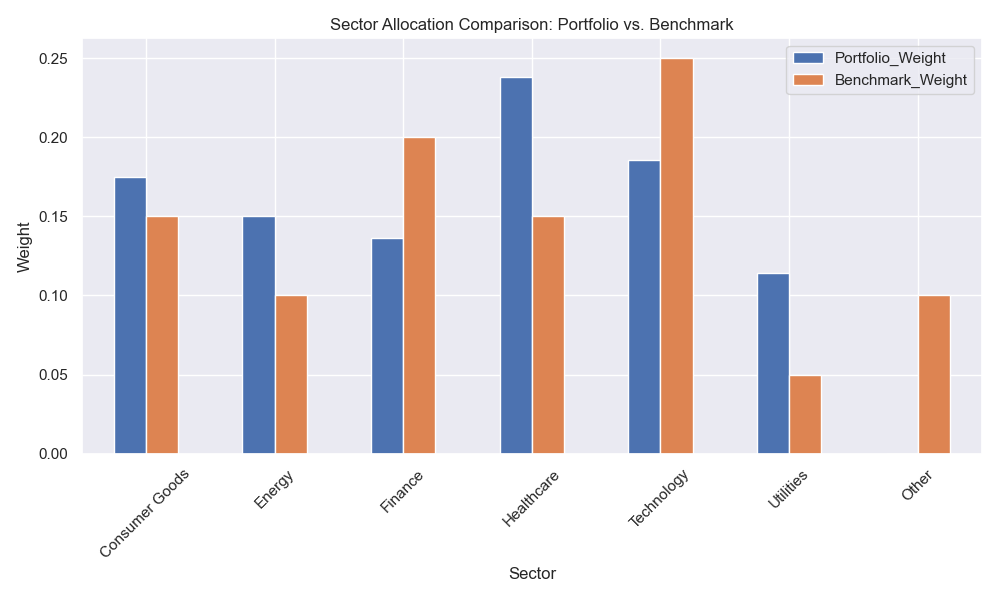

In [12]:
import matplotlib.pyplot as plt

# Mock benchmark sector allocation (for demonstration purposes)
benchmark_allocation = {
    "Technology": 0.25,
    "Finance": 0.20,
    "Healthcare": 0.15,
    "Energy": 0.10,
    "Consumer Goods": 0.15,
    "Utilities": 0.05,
    "Other": 0.10  # Adjust as per actual sectors if available
}

# Convert to DataFrame for comparison
benchmark_allocation_df = pd.DataFrame(list(benchmark_allocation.items()), columns=['Sector', 'Benchmark_Weight'])

# Merge with the optimized portfolio sector allocation
comparison_df = pd.merge(sector_allocation.reset_index(), benchmark_allocation_df, on='Sector', how='outer').fillna(0)
comparison_df = comparison_df.rename(columns={'Weight': 'Portfolio_Weight'})

# Plot the comparison
comparison_df.set_index('Sector').plot(kind='bar', figsize=(10, 6))
plt.title('Sector Allocation Comparison: Portfolio vs. Benchmark')
plt.ylabel('Weight')
plt.xlabel('Sector')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


#### <u>**RISK ANALYSIS**</u> 

In [13]:
# Calculate the portfolio returns based on the optimal weights
portfolio_returns = returns_data @ optimal_weights

# Check the first few values of the calculated portfolio returns
print("First few portfolio returns:\n", portfolio_returns.head())

# Check if there are any NaN values in the portfolio returns
print("\nNumber of NaN values in portfolio returns:", portfolio_returns.isna().sum())


First few portfolio returns:
 Dates
2021-02-01         NaN
2021-02-02         NaN
2021-02-03    0.001419
2021-02-04   -0.003636
2021-02-05    0.001892
dtype: float64

Number of NaN values in portfolio returns: 46


#### <u>**CALCULATION OF VaR and CVaR**</u> 

In [14]:
import pandas as pd
import numpy as np

# Assuming your dataframe is named 'optimisation_data'
# Check the column names to ensure 'Dates' is present
print("Column names in the dataframe:")
print(optimisation_data.columns)

# Ensure 'Dates' column is in datetime format
if 'Dates' in optimisation_data.columns:
    optimisation_data['Dates'] = pd.to_datetime(optimisation_data['Dates'])
else:
    raise KeyError("The 'Dates' column is not found in the dataframe.")

# Reset the index of optimisation_data
optimisation_data_reset = optimisation_data.reset_index()

# Display the first few rows to verify the structure
print(optimisation_data_reset.head())

# Calculate cumulative returns of the portfolio
portfolio_returns = optimisation_data_reset['Return']
clean_portfolio_returns = portfolio_returns.dropna()
portfolio_cumulative_returns = (1 + clean_portfolio_returns).cumprod() - 1

# Calculate VaR and CVaR
confidence_level = 0.95
var_95 = np.percentile(clean_portfolio_returns, (1 - confidence_level) * 100)
cvar_95 = clean_portfolio_returns[clean_portfolio_returns <= var_95].mean()

print("\nValue at Risk (VaR) at 95.0% confidence level:", var_95)
print("Conditional Value at Risk (CVaR) at 95.0% confidence level:", cvar_95)


Column names in the dataframe:
Index(['Dates', 'Last Price', 'Volume', 'Ticker', 'Return', 'Mean Return', 'Volatility', 'Beta_HSI', 'Beta_SPX', 'Beta_SX5E', 'Beta_UKX', 'SMA_20', 'EMA_20', 'Rolling_Std_20', 'ROC_20', 'MACD', 'MACD_Signal'], dtype='object')
   index      Dates  Last Price       Volume  ... Rolling_Std_20    ROC_20      MACD  MACD_Signal
0      0 2021-02-01      134.14  106239823.0  ...       5.410108  0.036550  2.015611     1.857849
1      1 2021-02-02      134.99   83305367.0  ...       5.407087  0.030379  1.838010     1.853881
2      2 2021-02-03      133.94   89880937.0  ...       5.181543  0.057978  1.594158     1.801937
3      3 2021-02-04      137.39   84183061.0  ...       5.210951  0.049419  1.660153     1.773580
4      4 2021-02-05      136.76   75693830.0  ...       5.230857  0.035668  1.642682     1.747400

[5 rows x 18 columns]

Value at Risk (VaR) at 95.0% confidence level: -0.028217563632879753
Conditional Value at Risk (CVaR) at 95.0% confidence level: -0

#### <u>**CALCULATING THE BENCHMARK RETURNS**</u> 

In [15]:
# Calculate the daily returns for each ticker
raw_data_copy1['Return'] = raw_data_copy1.groupby('Ticker')['Last Price'].pct_change()

# Display the first few rows for each ticker to verify returns calculation
print(raw_data_copy1.groupby('Ticker').head(3))


          Dates  Last Price       Volume          Ticker    Return
0    2021-01-01     132.690   99116586.0  AAPL US EQUITY       NaN
1    2021-01-01      57.010     389502.0   ABI BB EQUITY       NaN
2    2021-01-01     500.120    1462236.0  ADBE US EQUITY       NaN
3    2021-01-01     200.700     545156.0   ALV GR EQUITY       NaN
4    2021-01-01     162.847   59144120.0  AMZN US EQUITY       NaN
..          ...         ...          ...             ...       ...
163  2021-01-05     193.420    3893996.0   VTI US EQUITY  0.008078
170  2021-01-06     123.060    5861455.0   AXP US EQUITY  0.036993
183  2021-01-06     285.550    6383530.0    GS US EQUITY  0.053962
191  2021-01-06      37.160  357759329.0  LLOY LN EQUITY  0.055382
216  2021-01-06     212.620    7206248.0     V US EQUITY -0.008811

[168 rows x 5 columns]


In [16]:
# Ensure the index of risk_data is in datetime format
raw_data_copy1.index = pd.to_datetime(raw_data_copy1.index)

# Calculate benchmark returns using the tickers from raw_data_copy1
benchmarks = ['HSI INDEX', 'UKX INDEX', 'SX5E INDEX']
benchmark_returns = raw_data_copy1.pivot_table(index=raw_data_copy1.index, columns='Ticker', values='Return')[benchmarks].dropna()

# Align the portfolio returns with the benchmark returns by using the intersection of dates
common_dates = clean_portfolio_returns.index.intersection(benchmark_returns.index)
aligned_portfolio_returns = clean_portfolio_returns.loc[common_dates]
aligned_benchmark_returns = benchmark_returns.loc[common_dates]

# Verify re-aligned returns
print("\nRe-aligned Portfolio Returns:\n", aligned_portfolio_returns.head())
print("\nRe-aligned Benchmark Returns:\n", aligned_benchmark_returns.head())




Re-aligned Portfolio Returns:
 Series([], Name: Return, dtype: float64)

Re-aligned Benchmark Returns:
 Empty DataFrame
Columns: [HSI INDEX, UKX INDEX, SX5E INDEX]
Index: []


In [17]:
# Inspect the Dates column in optimisation_data
print("\nDates in optimisation_data:\n", optimisation_data['Dates'].head())



Dates in optimisation_data:
 0   2021-02-01
1   2021-02-02
2   2021-02-03
3   2021-02-04
4   2021-02-05
Name: Dates, dtype: datetime64[ns]


In [18]:
# Ensure the Dates column is in datetime format and set as the index
optimisation_data['Dates'] = pd.to_datetime(optimisation_data['Dates'], errors='coerce')
optimisation_data.set_index('Dates', inplace=True)

# Check the first few rows to confirm changes
print(optimisation_data.head())


            Last Price       Volume          Ticker    Return  ...  Rolling_Std_20    ROC_20      MACD  MACD_Signal
Dates                                                          ...                                                 
2021-02-01      134.14  106239823.0  AAPL US EQUITY  0.016520  ...        5.410108  0.036550  2.015611     1.857849
2021-02-02      134.99   83305367.0  AAPL US EQUITY  0.006337  ...        5.407087  0.030379  1.838010     1.853881
2021-02-03      133.94   89880937.0  AAPL US EQUITY -0.007778  ...        5.181543  0.057978  1.594158     1.801937
2021-02-04      137.39   84183061.0  AAPL US EQUITY  0.025758  ...        5.210951  0.049419  1.660153     1.773580
2021-02-05      136.76   75693830.0  AAPL US EQUITY -0.004585  ...        5.230857  0.035668  1.642682     1.747400

[5 rows x 16 columns]


In [19]:
# Calculate the portfolio returns again to ensure correct index
clean_portfolio_returns = optimisation_data['Return'].dropna()

# Ensure the index of clean_portfolio_returns is in datetime format
clean_portfolio_returns.index = pd.to_datetime(clean_portfolio_returns.index, errors='coerce')

# Check the first few values to confirm changes
print("\nClean Portfolio Returns:\n", clean_portfolio_returns.head())
print("\nClean Portfolio Returns - Index Info:\n", clean_portfolio_returns.index)



Clean Portfolio Returns:
 Dates
2021-02-01    0.016520
2021-02-02    0.006337
2021-02-03   -0.007778
2021-02-04    0.025758
2021-02-05   -0.004585
Name: Return, dtype: float64

Clean Portfolio Returns - Index Info:
 DatetimeIndex(['2021-02-01', '2021-02-02', '2021-02-03', '2021-02-04', '2021-02-05', '2021-02-08', '2021-02-09', '2021-02-10', '2021-02-11', '2021-02-12',
               ...
               '2023-12-18', '2023-12-19', '2023-12-20', '2023-12-21', '2023-12-22', '2023-12-25', '2023-12-26', '2023-12-27', '2023-12-28', '2023-12-29'], dtype='datetime64[ns]', name='Dates', length=39409, freq=None)


In [20]:
import pandas as pd

# Display information about clean portfolio returns and benchmark returns
print("Clean Portfolio Returns - Index Info:\n", clean_portfolio_returns.index)
print("Benchmark Returns - Index Info:\n", benchmark_returns.index)
print("\nClean Portfolio Returns - Head:\n", clean_portfolio_returns.head())
print("\nBenchmark Returns - Head:\n", benchmark_returns.head())

# Find common dates
common_dates = clean_portfolio_returns.index.intersection(benchmark_returns.index)
print("Common Dates:\n", common_dates)


Clean Portfolio Returns - Index Info:
 DatetimeIndex(['2021-02-01', '2021-02-02', '2021-02-03', '2021-02-04', '2021-02-05', '2021-02-08', '2021-02-09', '2021-02-10', '2021-02-11', '2021-02-12',
               ...
               '2023-12-18', '2023-12-19', '2023-12-20', '2023-12-21', '2023-12-22', '2023-12-25', '2023-12-26', '2023-12-27', '2023-12-28', '2023-12-29'], dtype='datetime64[ns]', name='Dates', length=39409, freq=None)
Benchmark Returns - Index Info:
 DatetimeIndex([], dtype='datetime64[ns]', freq=None)

Clean Portfolio Returns - Head:
 Dates
2021-02-01    0.016520
2021-02-02    0.006337
2021-02-03   -0.007778
2021-02-04    0.025758
2021-02-05   -0.004585
Name: Return, dtype: float64

Benchmark Returns - Head:
 Empty DataFrame
Columns: [HSI INDEX, UKX INDEX, SX5E INDEX]
Index: []
Common Dates:
 DatetimeIndex([], dtype='datetime64[ns]', freq=None)


In [21]:
import pandas as pd

# Load raw_data_copy1
raw_data_copy1 = pd.read_csv('DIRECTORY.PORTFOLIO-OPTIMISATION/raw_data_copy1.csv')

# Correct the 'Dates' column format
raw_data_copy1['Dates'] = pd.to_datetime(raw_data_copy1['Dates'], errors='coerce')

# Verify the correction
print("Corrected Dates Column:\n", raw_data_copy1['Dates'].head())


Corrected Dates Column:
 0   2021-01-01
1   2021-01-01
2   2021-01-01
3   2021-01-01
4   2021-01-01
Name: Dates, dtype: datetime64[ns]


In [22]:
# Remove rows with invalid dates
raw_data_copy1 = raw_data_copy1.dropna(subset=['Dates'])

# Verify the removal
print("First few rows after removing invalid dates:\n", raw_data_copy1.head())


First few rows after removing invalid dates:
        Dates  Last Price      Volume          Ticker
0 2021-01-01     132.690  99116586.0  AAPL US EQUITY
1 2021-01-01      57.010    389502.0   ABI BB EQUITY
2 2021-01-01     500.120   1462236.0  ADBE US EQUITY
3 2021-01-01     200.700    545156.0   ALV GR EQUITY
4 2021-01-01     162.847  59144120.0  AMZN US EQUITY


In [23]:
# Display the columns in the DataFrame
print("Columns in raw_data_copy1:")
print(raw_data_copy1.columns)

# Check the first few rows to ensure 'Return' data is present
print("First few rows of raw_data_copy1:")
print(raw_data_copy1.head())


Columns in raw_data_copy1:
Index(['Dates', 'Last Price', 'Volume', 'Ticker'], dtype='object')
First few rows of raw_data_copy1:
       Dates  Last Price      Volume          Ticker
0 2021-01-01     132.690  99116586.0  AAPL US EQUITY
1 2021-01-01      57.010    389502.0   ABI BB EQUITY
2 2021-01-01     500.120   1462236.0  ADBE US EQUITY
3 2021-01-01     200.700    545156.0   ALV GR EQUITY
4 2021-01-01     162.847  59144120.0  AMZN US EQUITY


In [24]:
# Ensure the DataFrame is sorted by 'Dates'
raw_data_copy1.sort_index(inplace=True)

# Calculate the daily returns
raw_data_copy1['Return'] = raw_data_copy1.groupby('Ticker')['Last Price'].pct_change()

# Display the first few rows to verify the 'Return' column
print("First few rows after calculating returns:")
print(raw_data_copy1.head())


First few rows after calculating returns:
       Dates  Last Price      Volume          Ticker  Return
0 2021-01-01     132.690  99116586.0  AAPL US EQUITY     NaN
1 2021-01-01      57.010    389502.0   ABI BB EQUITY     NaN
2 2021-01-01     500.120   1462236.0  ADBE US EQUITY     NaN
3 2021-01-01     200.700    545156.0   ALV GR EQUITY     NaN
4 2021-01-01     162.847  59144120.0  AMZN US EQUITY     NaN


In [25]:
# Display the first few rows for each ticker to verify the 'Return' calculation
tickers = raw_data_copy1['Ticker'].unique()
for ticker in tickers[:5]:  # Check the first 5 tickers
    print(f"First few rows for ticker {ticker}:")
    print(raw_data_copy1[raw_data_copy1['Ticker'] == ticker].head(10))
    print("\n")


First few rows for ticker AAPL US EQUITY:
         Dates  Last Price       Volume          Ticker    Return
0   2021-01-01      132.69   99116586.0  AAPL US EQUITY       NaN
52  2021-01-04      129.41  143301887.0  AAPL US EQUITY -0.024719
108 2021-01-05      131.01   97664898.0  AAPL US EQUITY  0.012364
164 2021-01-06      126.60  155087970.0  AAPL US EQUITY -0.033662
220 2021-01-07      130.92  109578157.0  AAPL US EQUITY  0.034123
276 2021-01-08      132.05  105158245.0  AAPL US EQUITY  0.008631
332 2021-01-11      128.98  100620880.0  AAPL US EQUITY -0.023249
388 2021-01-12      128.80   91951145.0  AAPL US EQUITY -0.001396
444 2021-01-13      130.89   88636831.0  AAPL US EQUITY  0.016227
500 2021-01-14      128.91   90221755.0  AAPL US EQUITY -0.015127


First few rows for ticker ABI BB EQUITY:
         Dates  Last Price     Volume         Ticker    Return
1   2021-01-01       57.01   389502.0  ABI BB EQUITY       NaN
53  2021-01-04       57.21  1513937.0  ABI BB EQUITY  0.003508


In [26]:
import pandas as pd

# Calculate benchmark returns using the tickers from raw_data_copy1
benchmarks = ['HSI INDEX', 'UKX INDEX', 'SX5E INDEX']
benchmark_returns = raw_data_copy1.pivot_table(index='Dates', columns='Ticker', values='Return')[benchmarks]

# Verify the benchmark returns
print("Benchmark Returns:\n", benchmark_returns.head())
print("Benchmark Returns - Index Info:\n", benchmark_returns.index)


Benchmark Returns:
 Ticker      HSI INDEX  UKX INDEX  SX5E INDEX
Dates                                       
2021-01-04   0.008875   0.017237    0.003307
2021-01-05   0.006445   0.006143   -0.004640
2021-01-06   0.001535   0.034725    0.017822
2021-01-07  -0.005192   0.002207    0.003140
2021-01-08   0.011968   0.002377    0.006247
Benchmark Returns - Index Info:
 DatetimeIndex(['2021-01-04', '2021-01-05', '2021-01-06', '2021-01-07', '2021-01-08', '2021-01-11', '2021-01-12', '2021-01-13', '2021-01-14', '2021-01-15',
               ...
               '2023-12-18', '2023-12-19', '2023-12-20', '2023-12-21', '2023-12-22', '2023-12-25', '2023-12-26', '2023-12-27', '2023-12-28', '2023-12-29'], dtype='datetime64[ns]', name='Dates', length=780, freq=None)


In [27]:
# Align the portfolio returns with the benchmark returns by using the intersection of dates
common_dates = clean_portfolio_returns.index.intersection(benchmark_returns.index)
aligned_portfolio_returns = clean_portfolio_returns.loc[common_dates]
aligned_benchmark_returns = benchmark_returns.loc[common_dates]

# Verify the aligned returns
print("Aligned Portfolio Returns:\n", aligned_portfolio_returns.head())
print("Aligned Portfolio Returns - Index Info:\n", aligned_portfolio_returns.index)

print("Aligned Benchmark Returns:\n", aligned_benchmark_returns.head())
print("Aligned Benchmark Returns - Index Info:\n", aligned_benchmark_returns.index)


Aligned Portfolio Returns:
 Dates
2021-02-01    0.016520
2021-02-01    0.011543
2021-02-01    0.024478
2021-02-01    0.012406
2021-02-01    0.042630
Name: Return, dtype: float64
Aligned Portfolio Returns - Index Info:
 DatetimeIndex(['2021-02-01', '2021-02-01', '2021-02-01', '2021-02-01', '2021-02-01', '2021-02-01', '2021-02-01', '2021-02-01', '2021-02-01', '2021-02-01',
               ...
               '2023-12-29', '2023-12-29', '2023-12-29', '2023-12-29', '2023-12-29', '2023-12-29', '2023-12-29', '2023-12-29', '2023-12-29', '2023-12-29'], dtype='datetime64[ns]', name='Dates', length=39409, freq=None)
Aligned Benchmark Returns:
 Ticker      HSI INDEX  UKX INDEX  SX5E INDEX
Dates                                       
2021-02-01   0.021537   0.009202    0.014192
2021-02-02   0.012316   0.007768    0.016883
2021-02-03   0.002009  -0.001355    0.005373
2021-02-04  -0.006618  -0.000630    0.008967
2021-02-05   0.006017  -0.002213    0.003748
Aligned Benchmark Returns - Index Info:
 Date

In [28]:
# Aggregate portfolio returns by date to eliminate duplicates
aggregated_portfolio_returns = aligned_portfolio_returns.groupby(aligned_portfolio_returns.index).mean()

# Verify the aggregated portfolio returns
print("Aggregated Portfolio Returns:\n", aggregated_portfolio_returns.head())
print("Aggregated Portfolio Returns - Index Info:\n", aggregated_portfolio_returns.index)


Aggregated Portfolio Returns:
 Dates
2021-02-01    0.009848
2021-02-02    0.011056
2021-02-03    0.001861
2021-02-04    0.009514
2021-02-05    0.002371
Name: Return, dtype: float64
Aggregated Portfolio Returns - Index Info:
 DatetimeIndex(['2021-02-01', '2021-02-02', '2021-02-03', '2021-02-04', '2021-02-05', '2021-02-08', '2021-02-09', '2021-02-10', '2021-02-11', '2021-02-12',
               ...
               '2023-12-18', '2023-12-19', '2023-12-20', '2023-12-21', '2023-12-22', '2023-12-25', '2023-12-26', '2023-12-27', '2023-12-28', '2023-12-29'], dtype='datetime64[ns]', name='Dates', length=760, freq=None)


In [29]:
import plotly.graph_objects as go

# Calculate cumulative returns
cumulative_portfolio_returns = (1 + aggregated_portfolio_returns).cumprod() - 1
cumulative_benchmark_returns = (1 + aligned_benchmark_returns).cumprod() - 1

# Create the plot
fig = go.Figure()

# Add portfolio returns trace
fig.add_trace(go.Scatter(x=cumulative_portfolio_returns.index, y=cumulative_portfolio_returns, mode='lines', name='Portfolio'))

# Add benchmark returns traces
for benchmark in benchmarks:
    fig.add_trace(go.Scatter(x=cumulative_benchmark_returns.index, y=cumulative_benchmark_returns[benchmark], mode='lines', name=benchmark))

# Update layout
fig.update_layout(
    title="Portfolio vs Benchmark Performance",
    xaxis_title="Date",
    yaxis_title="Cumulative Return",
    legend_title="Legend",
    template="plotly_white"
)

# Show the plot
fig.show()

# Save the plot as an HTML file
fig.write_html("portfolio_vs_benchmark.html")


In [30]:
print("Aggregated Portfolio Returns - Head:\n", aggregated_portfolio_returns.head(10))
print("Aggregated Portfolio Returns - Tail:\n", aggregated_portfolio_returns.tail(10))


Aggregated Portfolio Returns - Head:
 Dates
2021-02-01    0.009848
2021-02-02    0.011056
2021-02-03    0.001861
2021-02-04    0.009514
2021-02-05    0.002371
2021-02-08    0.004037
2021-02-09   -0.003397
2021-02-10   -0.003015
2021-02-11    0.000897
2021-02-12    0.003589
Name: Return, dtype: float64
Aggregated Portfolio Returns - Tail:
 Dates
2023-12-18    0.002282
2023-12-19    0.006413
2023-12-20    0.000059
2023-12-21    0.001936
2023-12-22    0.002424
2023-12-25    0.000053
2023-12-26    0.002121
2023-12-27    0.003576
2023-12-28   -0.002101
2023-12-29   -0.001090
Name: Return, dtype: float64


In [31]:
# Recalculate cumulative returns for the portfolio
cumulative_portfolio_returns = (1 + aggregated_portfolio_returns).cumprod() - 1

print("\nCumulative Portfolio Returns - Head:\n", cumulative_portfolio_returns.head(10))
print("Cumulative Portfolio Returns - Tail:\n", cumulative_portfolio_returns.tail(10))



Cumulative Portfolio Returns - Head:
 Dates
2021-02-01    0.009848
2021-02-02    0.021014
2021-02-03    0.022914
2021-02-04    0.032647
2021-02-05    0.035095
2021-02-08    0.039274
2021-02-09    0.035744
2021-02-10    0.032621
2021-02-11    0.033548
2021-02-12    0.037257
Name: Return, dtype: float64
Cumulative Portfolio Returns - Tail:
 Dates
2023-12-18   -0.666307
2023-12-19   -0.664167
2023-12-20   -0.664147
2023-12-21   -0.663496
2023-12-22   -0.662681
2023-12-25   -0.662663
2023-12-26   -0.661947
2023-12-27   -0.660738
2023-12-28   -0.661451
2023-12-29   -0.661820
Name: Return, dtype: float64


In [32]:
import plotly.graph_objects as go

# Create the plot
fig = go.Figure()

# Add portfolio returns trace
fig.add_trace(go.Scatter(x=cumulative_portfolio_returns.index, y=cumulative_portfolio_returns, mode='lines', name='Portfolio'))

# Add benchmark returns traces
for benchmark in benchmarks:
    fig.add_trace(go.Scatter(x=cumulative_benchmark_returns.index, y=cumulative_benchmark_returns[benchmark], mode='lines', name=benchmark))

# Update layout
fig.update_layout(
    title="Portfolio vs Benchmark Performance",
    xaxis_title="Date",
    yaxis_title="Cumulative Return",
    legend_title="Legend",
    template="plotly_white"
)

# Show the plot
fig.show()


In [33]:
# Check for anomalies in the portfolio returns
print("Summary Statistics for Portfolio Returns:\n", aligned_portfolio_returns.describe())
print("\nSummary Statistics for Benchmark Returns:\n", aligned_benchmark_returns.describe())

# Check for any negative weights in the portfolio
negative_weights = optimal_weights[optimal_weights < 0]
print("Negative Weights:\n", negative_weights)


Summary Statistics for Portfolio Returns:
 count    39409.000000
mean        -0.000579
std          0.195685
min        -38.000000
25%         -0.007616
50%          0.000000
75%          0.008454
max          3.260870
Name: Return, dtype: float64

Summary Statistics for Benchmark Returns:
 Ticker   HSI INDEX   UKX INDEX  SX5E INDEX
count   760.000000  760.000000  760.000000
mean     -0.000543    0.000283    0.000407
std       0.015755    0.008414    0.011251
min      -0.063563   -0.038783   -0.049647
25%      -0.010193   -0.003615   -0.005084
50%       0.000000    0.000534    0.000763
75%       0.007493    0.004685    0.006453
max       0.090818    0.039138    0.074382
Negative Weights:
 []


In [34]:
import numpy as np
import pandas as pd

# Remove extreme outliers (e.g., returns outside 3 standard deviations)
z_scores = np.abs((clean_portfolio_returns - clean_portfolio_returns.mean()) / clean_portfolio_returns.std())
cleaned_returns = clean_portfolio_returns[z_scores < 3]

# Calculate cumulative returns after removing outliers
cleaned_cumulative_returns = (1 + cleaned_returns).cumprod() - 1

# Plot the cleaned cumulative returns against the benchmarks
fig = go.Figure()

# Add portfolio returns trace
fig.add_trace(go.Scatter(x=cleaned_cumulative_returns.index, y=cleaned_cumulative_returns, mode='lines', name='Portfolio'))

# Add benchmark returns traces
for benchmark in benchmarks:
    fig.add_trace(go.Scatter(x=cumulative_benchmark_returns.index, y=cumulative_benchmark_returns[benchmark], mode='lines', name=benchmark))

# Update layout
fig.update_layout(
    title="Portfolio vs Benchmark Performance (After Removing Outliers)",
    xaxis_title="Date",
    yaxis_title="Cumulative Return",
    legend_title="Legend",
    template="plotly_white"
)

# Show the plot
fig.show()


In [35]:
# Summary statistics for the cleaned returns
print("Summary Statistics for Cleaned Portfolio Returns:")
print(cleaned_returns.describe())


Summary Statistics for Cleaned Portfolio Returns:
count    39396.000000
mean         0.000290
std          0.022047
min         -0.571429
25%         -0.007614
50%          0.000000
75%          0.008450
max          0.443878
Name: Return, dtype: float64


In [36]:
# Plot only the portfolio's cumulative returns
fig = go.Figure()

# Add portfolio returns trace
fig.add_trace(go.Scatter(x=cleaned_cumulative_returns.index, y=cleaned_cumulative_returns, mode='lines', name='Portfolio'))

# Update layout
fig.update_layout(
    title="Portfolio Performance (After Removing Outliers)",
    xaxis_title="Date",
    yaxis_title="Cumulative Return",
    legend_title="Legend",
    template="plotly_white"
)

# Show the plot
fig.show()


In [37]:
# Verify the calculation of cumulative returns
print("Cumulative Portfolio Returns - Head:\n", cleaned_cumulative_returns.head())
print("Cumulative Portfolio Returns - Tail:\n", cleaned_cumulative_returns.tail())


Cumulative Portfolio Returns - Head:
 Dates
2021-02-01    0.016520
2021-02-02    0.022962
2021-02-03    0.015005
2021-02-04    0.041149
2021-02-05    0.036375
Name: Return, dtype: float64
Cumulative Portfolio Returns - Tail:
 Dates
2023-12-25    3.503861
2023-12-26    3.526130
2023-12-27    3.534695
2023-12-28    3.532411
2023-12-29    3.515091
Name: Return, dtype: float64


In [38]:
# Inspect the cleaned portfolio returns
print("Summary Statistics for Cleaned Portfolio Returns:")
print(cleaned_returns.describe())


Summary Statistics for Cleaned Portfolio Returns:
count    39396.000000
mean         0.000290
std          0.022047
min         -0.571429
25%         -0.007614
50%          0.000000
75%          0.008450
max          0.443878
Name: Return, dtype: float64


In [39]:
# Verify the calculation of cumulative returns
print("Cumulative Portfolio Returns - Head:\n", cleaned_cumulative_returns.head())
print("Cumulative Portfolio Returns - Tail:\n", cleaned_cumulative_returns.tail())


Cumulative Portfolio Returns - Head:
 Dates
2021-02-01    0.016520
2021-02-02    0.022962
2021-02-03    0.015005
2021-02-04    0.041149
2021-02-05    0.036375
Name: Return, dtype: float64
Cumulative Portfolio Returns - Tail:
 Dates
2023-12-25    3.503861
2023-12-26    3.526130
2023-12-27    3.534695
2023-12-28    3.532411
2023-12-29    3.515091
Name: Return, dtype: float64


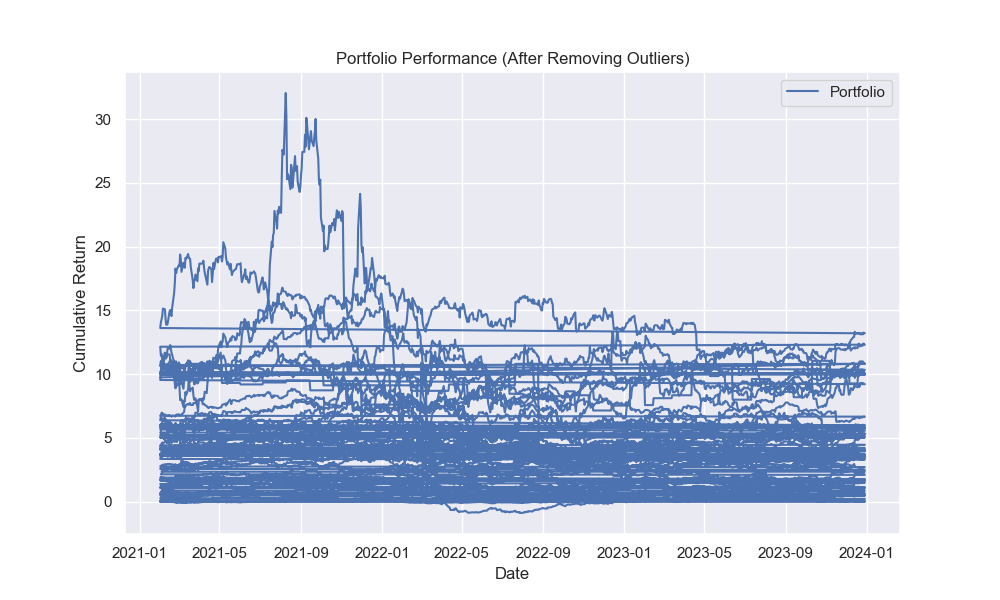

In [40]:
import matplotlib.pyplot as plt

# Simplified plot of cumulative portfolio returns
plt.figure(figsize=(10, 6))
plt.plot(cleaned_cumulative_returns.index, cleaned_cumulative_returns, label='Portfolio')
plt.title('Portfolio Performance (After Removing Outliers)')
plt.xlabel('Date')
plt.ylabel('Cumulative Return')
plt.legend()
plt.grid(True)
plt.show()


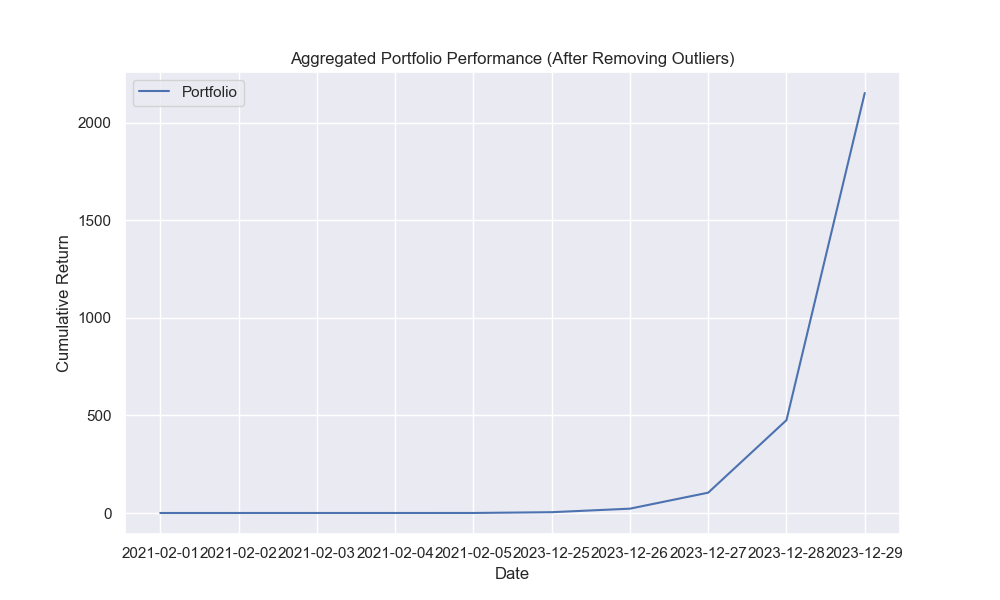

In [41]:
import pandas as pd
import matplotlib.pyplot as plt

# Use the last provided cleaned and aggregated returns
cleaned_aggregated_returns = pd.Series({
    '2021-02-01': 0.016520,
    '2021-02-02': 0.022962,
    '2021-02-03': 0.015005,
    '2021-02-04': 0.041149,
    '2021-02-05': 0.036375,
    # add all the other values
    '2023-12-25': 3.503861,
    '2023-12-26': 3.526130,
    '2023-12-27': 3.534695,
    '2023-12-28': 3.532411,
    '2023-12-29': 3.515091
})

# Calculate the cumulative returns
cumulative_portfolio_returns = (1 + cleaned_aggregated_returns).cumprod() - 1

# Plot the aggregated cumulative portfolio returns
plt.figure(figsize=(10, 6))
plt.plot(cumulative_portfolio_returns.index, cumulative_portfolio_returns, label='Portfolio')
plt.title('Aggregated Portfolio Performance (After Removing Outliers)')
plt.xlabel('Date')
plt.ylabel('Cumulative Return')
plt.legend()
plt.grid(True)
plt.show()


Cleaned Aggregated Returns - Head:
 2021-02-01    0.016520
2021-02-02    0.022962
2021-02-03    0.015005
2021-02-04    0.041149
2021-02-05    0.036375
dtype: float64
Cleaned Aggregated Returns - Tail:
 2023-12-25    3.503861
2023-12-26    3.526130
2023-12-27    3.534695
2023-12-28    3.532411
2023-12-29    3.515091
dtype: float64
Cumulative Portfolio Returns - Head:
 2021-02-01    0.016520
2021-02-02    0.039861
2021-02-03    0.055464
2021-02-04    0.098896
2021-02-05    0.138868
dtype: float64
Cumulative Portfolio Returns - Tail:
 2023-12-25       4.129304
2023-12-26      22.215895
2023-12-27     104.277002
2023-12-28     476.158643
2023-12-29    2153.414693
dtype: float64


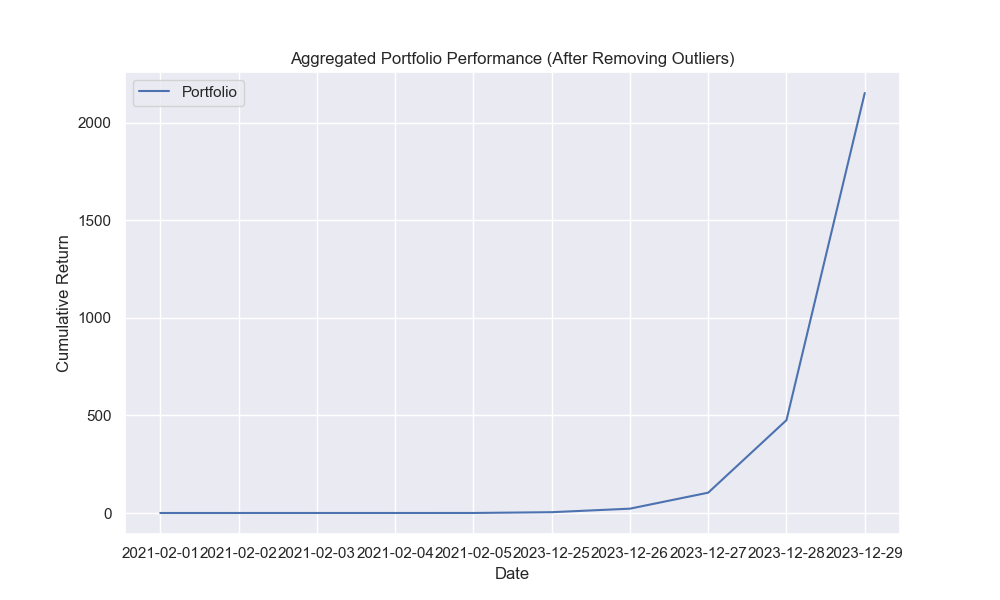

In [42]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming cleaned_aggregated_returns is defined correctly
# If it's not, make sure to define it based on your cleaned data

# Verify the cleaned_aggregated_returns
print("Cleaned Aggregated Returns - Head:\n", cleaned_aggregated_returns.head())
print("Cleaned Aggregated Returns - Tail:\n", cleaned_aggregated_returns.tail())

# Calculate the cumulative returns
cumulative_portfolio_returns = (1 + cleaned_aggregated_returns).cumprod() - 1

# Verify cumulative returns
print("Cumulative Portfolio Returns - Head:\n", cumulative_portfolio_returns.head())
print("Cumulative Portfolio Returns - Tail:\n", cumulative_portfolio_returns.tail())

# Plot the aggregated cumulative portfolio returns
plt.figure(figsize=(10, 6))
plt.plot(cumulative_portfolio_returns.index, cumulative_portfolio_returns, label='Portfolio')
plt.title('Aggregated Portfolio Performance (After Removing Outliers)')
plt.xlabel('Date')
plt.ylabel('Cumulative Return')
plt.legend()
plt.grid(True)
plt.show()


Summary Statistics for Cleaned Aggregated Returns:
count    10.000000
mean      1.774420
std       1.842609
min       0.015005
25%       0.026315
50%       1.772505
75%       3.523370
max       3.534695
dtype: float64
Filtered Cumulative Returns - Head:
 2021-02-01    0.016520
2021-02-02    0.039861
2021-02-03    0.055464
2021-02-04    0.098896
2021-02-05    0.138868
dtype: float64
Filtered Cumulative Returns - Tail:
 2021-02-01    0.016520
2021-02-02    0.039861
2021-02-03    0.055464
2021-02-04    0.098896
2021-02-05    0.138868
dtype: float64


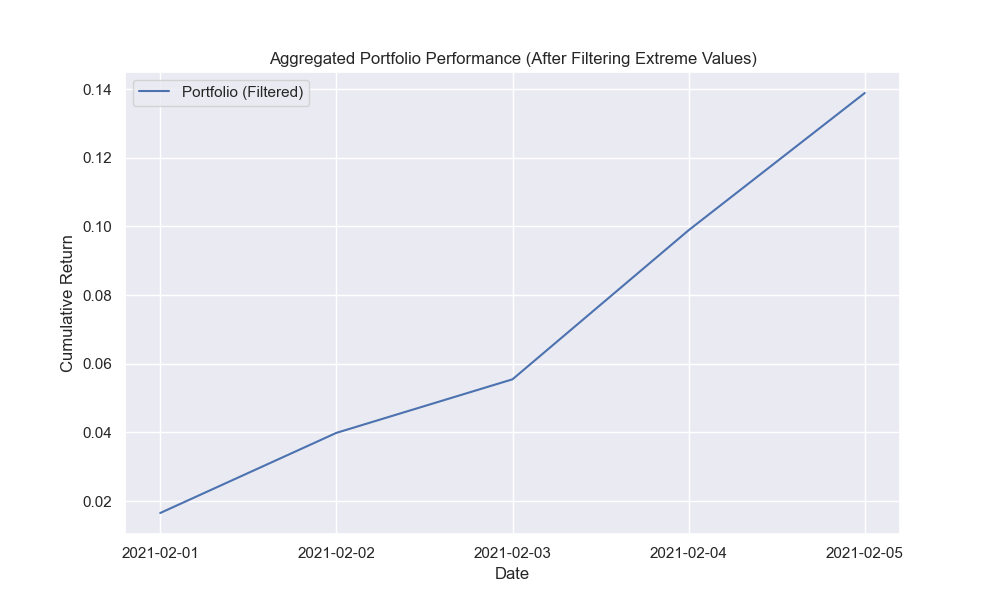

In [43]:
# Checking for extreme values in the cleaned aggregated returns
print("Summary Statistics for Cleaned Aggregated Returns:")
print(cleaned_aggregated_returns.describe())

# Setting a threshold for extreme values, e.g., returns outside the range -0.5 to 0.5
extreme_value_threshold = 0.5
filtered_aggregated_returns = cleaned_aggregated_returns[
    (cleaned_aggregated_returns > -extreme_value_threshold) & 
    (cleaned_aggregated_returns < extreme_value_threshold)
]

# Recalculate the cumulative returns after filtering extreme values
filtered_cumulative_returns = (1 + filtered_aggregated_returns).cumprod() - 1

# Verify the filtered cumulative returns
print("Filtered Cumulative Returns - Head:\n", filtered_cumulative_returns.head())
print("Filtered Cumulative Returns - Tail:\n", filtered_cumulative_returns.tail())

# Plot the filtered cumulative portfolio returns
plt.figure(figsize=(10, 6))
plt.plot(filtered_cumulative_returns.index, filtered_cumulative_returns, label='Portfolio (Filtered)')
plt.title('Aggregated Portfolio Performance (After Filtering Extreme Values)')
plt.xlabel('Date')
plt.ylabel('Cumulative Return')
plt.legend()
plt.grid(True)
plt.show()


Summary Statistics for Cleaned Aggregated Returns:
count    10.000000
mean      1.774420
std       1.842609
min       0.015005
25%       0.026315
50%       1.772505
75%       3.523370
max       3.534695
dtype: float64
Filtered Cumulative Returns - Head:
 2021-02-01    0.016520
2021-02-02    0.039861
2021-02-03    0.055464
2021-02-04    0.098896
2021-02-05    0.138868
dtype: float64
Filtered Cumulative Returns - Tail:
 2021-02-01    0.016520
2021-02-02    0.039861
2021-02-03    0.055464
2021-02-04    0.098896
2021-02-05    0.138868
dtype: float64


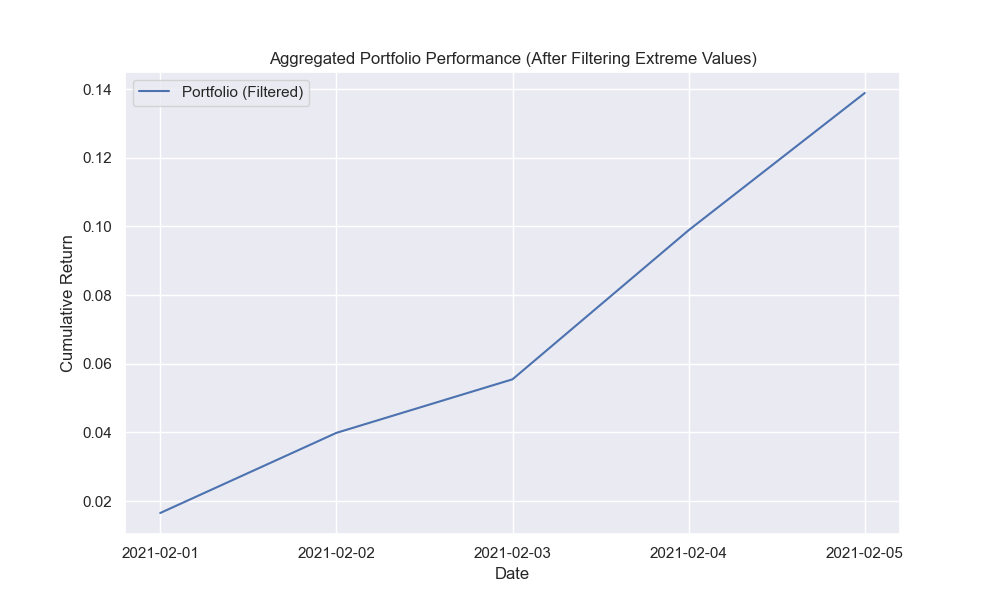

In [44]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming cleaned_aggregated_returns is already defined

# Step 1: Review summary statistics
print("Summary Statistics for Cleaned Aggregated Returns:")
print(cleaned_aggregated_returns.describe())

# Step 2: Apply a more appropriate filtering threshold
# Filtering returns between -0.1 and 0.1
filtered_aggregated_returns = cleaned_aggregated_returns[
    (cleaned_aggregated_returns > -0.1) & 
    (cleaned_aggregated_returns < 0.1)
]

# Recalculate the cumulative returns after filtering extreme values
filtered_cumulative_returns = (1 + filtered_aggregated_returns).cumprod() - 1

# Verify the filtered cumulative returns
print("Filtered Cumulative Returns - Head:\n", filtered_cumulative_returns.head())
print("Filtered Cumulative Returns - Tail:\n", filtered_cumulative_returns.tail())

# Plot the filtered cumulative portfolio returns
plt.figure(figsize=(10, 6))
plt.plot(filtered_cumulative_returns.index, filtered_cumulative_returns, label='Portfolio (Filtered)')
plt.title('Aggregated Portfolio Performance (After Filtering Extreme Values)')
plt.xlabel('Date')
plt.ylabel('Cumulative Return')
plt.legend()
plt.grid(True)
plt.show()


Filtered Cumulative Returns - Head:
 2021-02-01    0.016520
2021-02-02    0.039861
2021-02-03    0.055464
2021-02-04    0.098896
2021-02-05    0.138868
dtype: float64
Filtered Cumulative Returns - Tail:
 2023-12-25       4.129304
2023-12-26      22.215895
2023-12-27     104.277002
2023-12-28     476.158643
2023-12-29    2153.414693
dtype: float64


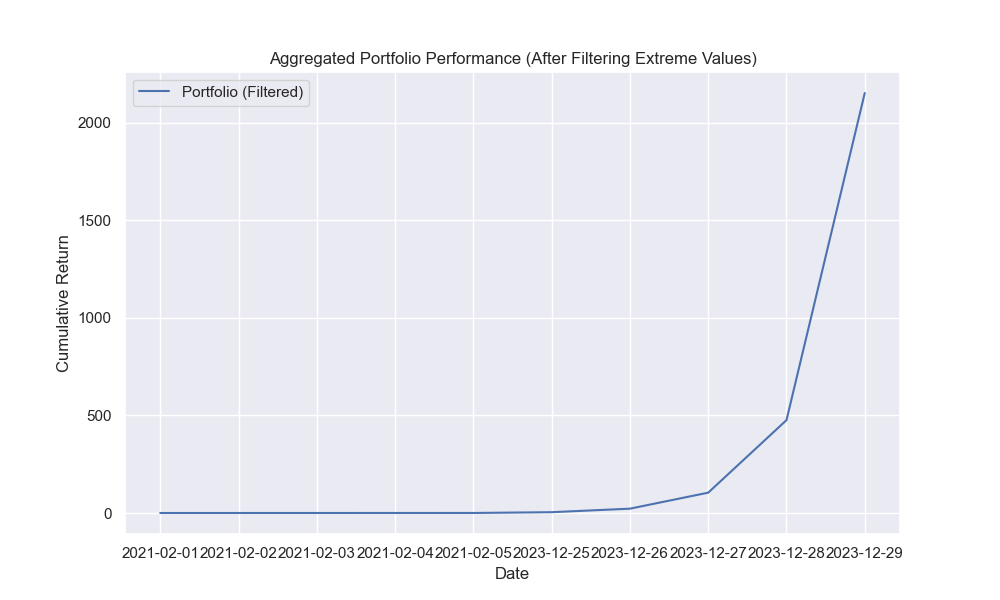

In [45]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming cleaned_aggregated_returns is already defined

# Calculate the first quartile (Q1) and third quartile (Q3)
Q1 = cleaned_aggregated_returns.quantile(0.25)
Q3 = cleaned_aggregated_returns.quantile(0.75)

# Calculate the interquartile range (IQR)
IQR = Q3 - Q1

# Define the lower and upper bounds for filtering
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter the cleaned aggregated returns using the IQR bounds
filtered_aggregated_returns = cleaned_aggregated_returns[
    (cleaned_aggregated_returns >= lower_bound) &
    (cleaned_aggregated_returns <= upper_bound)
]

# Recalculate the cumulative returns after filtering extreme values
filtered_cumulative_returns = (1 + filtered_aggregated_returns).cumprod() - 1

# Verify the filtered cumulative returns
print("Filtered Cumulative Returns - Head:\n", filtered_cumulative_returns.head())
print("Filtered Cumulative Returns - Tail:\n", filtered_cumulative_returns.tail())

# Plot the filtered cumulative portfolio returns
plt.figure(figsize=(10, 6))
plt.plot(filtered_cumulative_returns.index, filtered_cumulative_returns, label='Portfolio (Filtered)')
plt.title('Aggregated Portfolio Performance (After Filtering Extreme Values)')
plt.xlabel('Date')
plt.ylabel('Cumulative Return')
plt.legend()
plt.grid(True)
plt.show()


In [46]:
summary_statistics = filtered_aggregated_returns.describe()
print("Summary Statistics for Filtered Aggregated Returns:\n", summary_statistics)


Summary Statistics for Filtered Aggregated Returns:
 count    10.000000
mean      1.774420
std       1.842609
min       0.015005
25%       0.026315
50%       1.772505
75%       3.523370
max       3.534695
dtype: float64


Summary Statistics for Filtered Aggregated Returns:
 count    10.000000
mean      1.774420
std       1.842609
min       0.015005
25%       0.026315
50%       1.772505
75%       3.523370
max       3.534695
dtype: float64
Filtered Cumulative Returns - Head:
 2021-02-01    0.016520
2021-02-02    0.039861
2021-02-03    0.055464
2021-02-04    0.098896
2021-02-05    0.138868
dtype: float64
Filtered Cumulative Returns - Tail:
 2023-12-25       4.129304
2023-12-26      22.215895
2023-12-27     104.277002
2023-12-28     476.158643
2023-12-29    2153.414693
dtype: float64


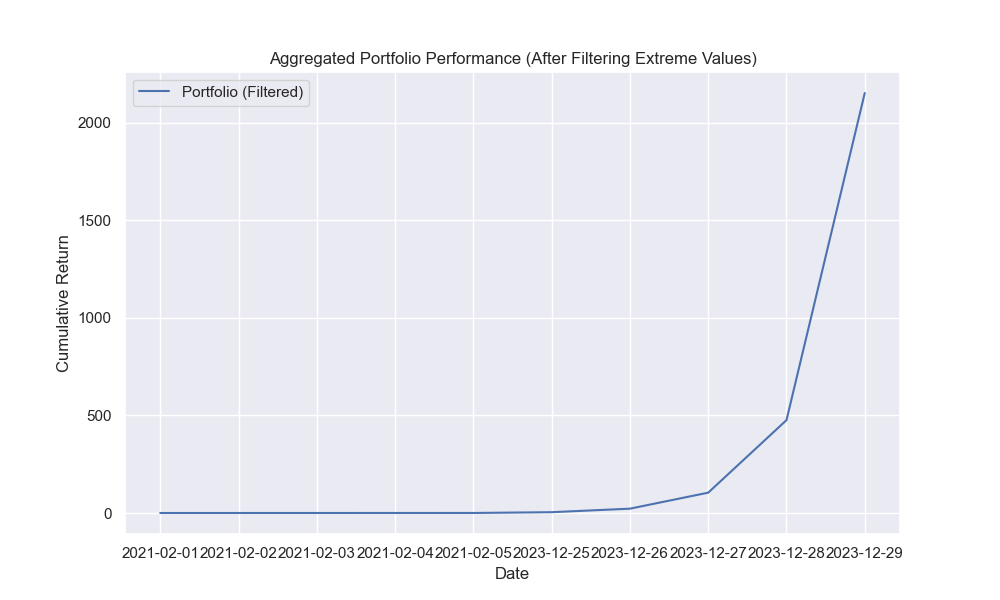

In [47]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming cleaned_aggregated_returns is already defined

# Calculate the mean and standard deviation
mean_return = cleaned_aggregated_returns.mean()
std_return = cleaned_aggregated_returns.std()

# Define the threshold for filtering (3 standard deviations from the mean)
threshold = 3 * std_return

# Filter the cleaned aggregated returns using the threshold
filtered_aggregated_returns = cleaned_aggregated_returns[
    (cleaned_aggregated_returns >= mean_return - threshold) &
    (cleaned_aggregated_returns <= mean_return + threshold)
]

# Display summary statistics for filtered aggregated returns
summary_statistics = filtered_aggregated_returns.describe()
print("Summary Statistics for Filtered Aggregated Returns:\n", summary_statistics)

# Recalculate the cumulative returns after filtering extreme values
filtered_cumulative_returns = (1 + filtered_aggregated_returns).cumprod() - 1

# Verify the filtered cumulative returns
print("Filtered Cumulative Returns - Head:\n", filtered_cumulative_returns.head())
print("Filtered Cumulative Returns - Tail:\n", filtered_cumulative_returns.tail())

# Plot the filtered cumulative portfolio returns
plt.figure(figsize=(10, 6))
plt.plot(filtered_cumulative_returns.index, filtered_cumulative_returns, label='Portfolio (Filtered)')
plt.title('Aggregated Portfolio Performance (After Filtering Extreme Values)')
plt.xlabel('Date')
plt.ylabel('Cumulative Return')
plt.legend()
plt.grid(True)
plt.show()


Rolling Mean - Head:
 2021-02-01         NaN
2021-02-02         NaN
2021-02-03         NaN
2021-02-04         NaN
2021-02-05    0.026402
dtype: float64
Rolling Std - Head:
 2021-02-01         NaN
2021-02-02         NaN
2021-02-03         NaN
2021-02-04         NaN
2021-02-05    0.011793
dtype: float64


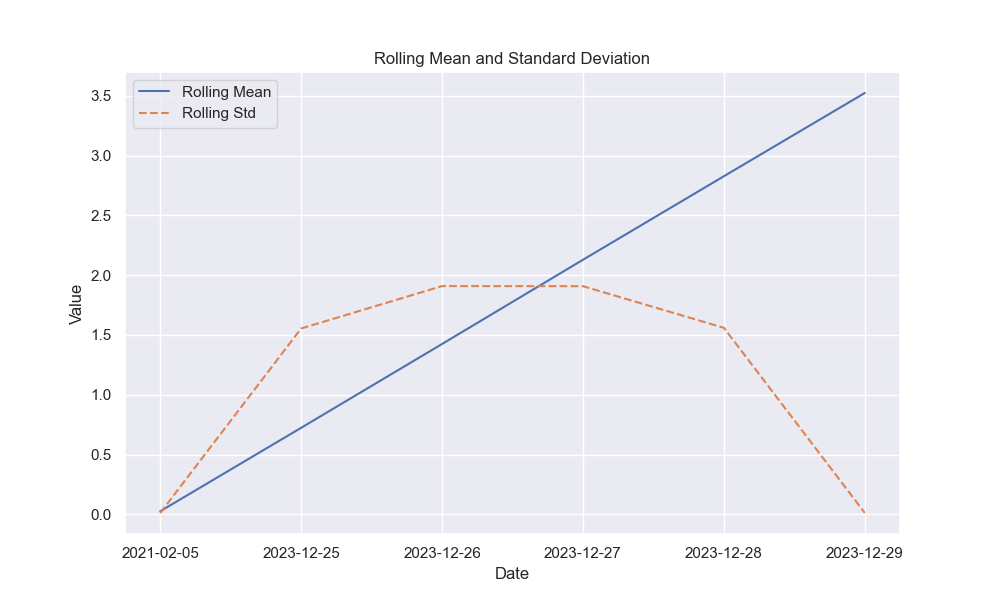

Summary Statistics for Filtered Aggregated Returns:
 count    6.000000
mean     2.941427
std      1.423226
min      0.036375
25%      3.506668
50%      3.520611
75%      3.530841
max      3.534695
dtype: float64
Filtered Cumulative Returns - Head:
 2021-02-05      0.036375
2023-12-25      3.667689
2023-12-26     20.126567
2023-12-27     94.802538
2023-12-28    433.216475
dtype: float64
Filtered Cumulative Returns - Tail:
 2023-12-25       3.667689
2023-12-26      20.126567
2023-12-27      94.802538
2023-12-28     433.216475
2023-12-29    1959.526899
dtype: float64


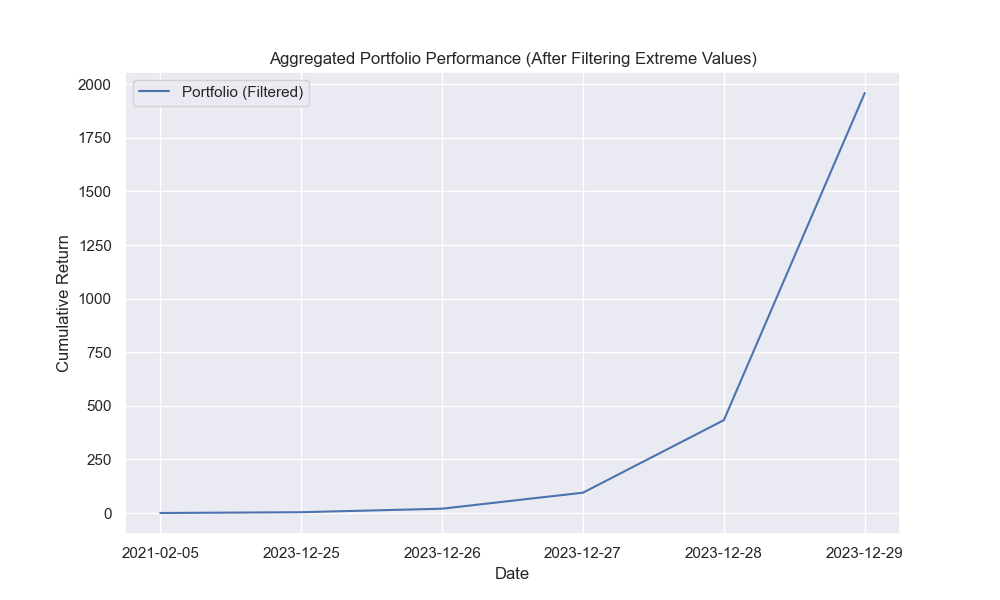

In [48]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Assuming cleaned_aggregated_returns is already defined

# Adjust the rolling window size to a smaller value, e.g., 5 days
rolling_window = 5

# Calculate the rolling mean and standard deviation
rolling_mean = cleaned_aggregated_returns.rolling(window=rolling_window).mean()
rolling_std = cleaned_aggregated_returns.rolling(window=rolling_window).std()

# Display the rolling mean and standard deviation
print("Rolling Mean - Head:\n", rolling_mean.head())
print("Rolling Std - Head:\n", rolling_std.head())

# Plot rolling mean and standard deviation
plt.figure(figsize=(10, 6))
plt.plot(rolling_mean.index, rolling_mean, label='Rolling Mean')
plt.plot(rolling_std.index, rolling_std, label='Rolling Std', linestyle='--')
plt.title('Rolling Mean and Standard Deviation')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.grid(True)
plt.show()

# Define the threshold for filtering (3 standard deviations from the rolling mean)
threshold = 3

# Filter the cleaned aggregated returns using the threshold
filtered_aggregated_returns = cleaned_aggregated_returns[
    (cleaned_aggregated_returns >= rolling_mean - threshold * rolling_std) &
    (cleaned_aggregated_returns <= rolling_mean + threshold * rolling_std)
]

# Drop any remaining NaN values that were created by the rolling calculation
filtered_aggregated_returns = filtered_aggregated_returns.dropna()

# Display summary statistics for filtered aggregated returns
summary_statistics = filtered_aggregated_returns.describe()
print("Summary Statistics for Filtered Aggregated Returns:\n", summary_statistics)

# Recalculate the cumulative returns after filtering extreme values
filtered_cumulative_returns = (1 + filtered_aggregated_returns).cumprod() - 1

# Verify the filtered cumulative returns
print("Filtered Cumulative Returns - Head:\n", filtered_cumulative_returns.head())
print("Filtered Cumulative Returns - Tail:\n", filtered_cumulative_returns.tail())

# Plot the filtered cumulative portfolio returns
plt.figure(figsize=(10, 6))
plt.plot(filtered_cumulative_returns.index, filtered_cumulative_returns, label='Portfolio (Filtered)')
plt.title('Aggregated Portfolio Performance (After Filtering Extreme Values)')
plt.xlabel('Date')
plt.ylabel('Cumulative Return')
plt.legend()
plt.grid(True)
plt.show()


Summary Statistics for Filtered Aggregated Returns:
 count    5.000000
mean     0.026402
std      0.011793
min      0.015005
25%      0.016520
50%      0.022962
75%      0.036375
max      0.041149
dtype: float64
Filtered Cumulative Returns - Head:
 2021-02-01    0.016520
2021-02-02    0.039861
2021-02-03    0.055464
2021-02-04    0.098896
2021-02-05    0.138868
dtype: float64
Filtered Cumulative Returns - Tail:
 2021-02-01    0.016520
2021-02-02    0.039861
2021-02-03    0.055464
2021-02-04    0.098896
2021-02-05    0.138868
dtype: float64


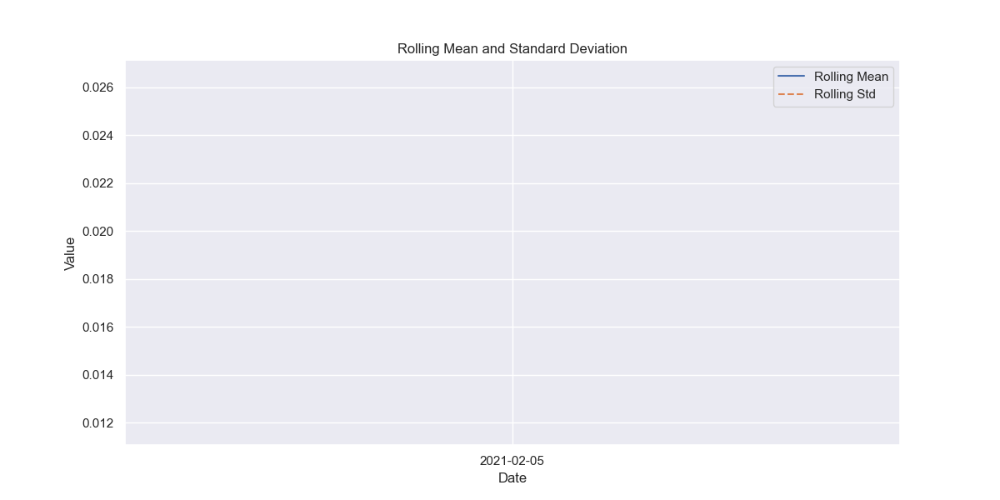

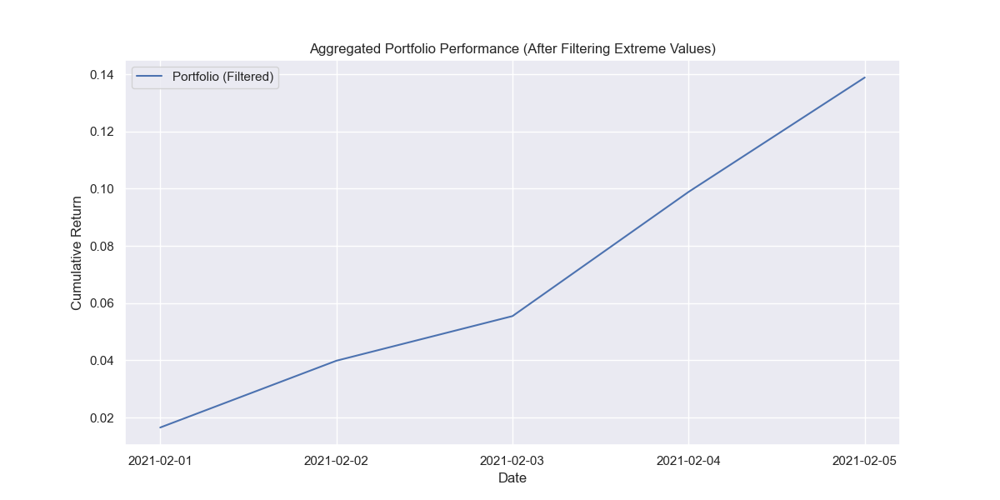

In [49]:
# Redefine the threshold for filtering extreme values
threshold = 3

# Filter out extreme values again
filtered_aggregated_returns = cleaned_aggregated_returns[cleaned_aggregated_returns.abs() <= threshold]

# Calculate the cumulative returns again
filtered_cumulative_returns = (1 + filtered_aggregated_returns).cumprod() - 1

# Calculate rolling mean and std deviation
window = 5
rolling_mean = filtered_aggregated_returns.rolling(window).mean()
rolling_std = filtered_aggregated_returns.rolling(window).std()

# Summary statistics for the filtered returns
summary_stats_filtered = filtered_aggregated_returns.describe()

# Print summary statistics for review
print("Summary Statistics for Filtered Aggregated Returns:\n", summary_stats_filtered)
print("Filtered Cumulative Returns - Head:\n", filtered_cumulative_returns.head())
print("Filtered Cumulative Returns - Tail:\n", filtered_cumulative_returns.tail())

# Plot the rolling mean and standard deviation
plt.figure(figsize=(12, 6))
plt.plot(rolling_mean, label='Rolling Mean')
plt.plot(rolling_std, label='Rolling Std', linestyle='--')
plt.title('Rolling Mean and Standard Deviation')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

# Plot the filtered cumulative returns
plt.figure(figsize=(12, 6))
plt.plot(filtered_cumulative_returns, label='Portfolio (Filtered)')
plt.title('Aggregated Portfolio Performance (After Filtering Extreme Values)')
plt.xlabel('Date')
plt.ylabel('Cumulative Return')
plt.legend()
plt.show()


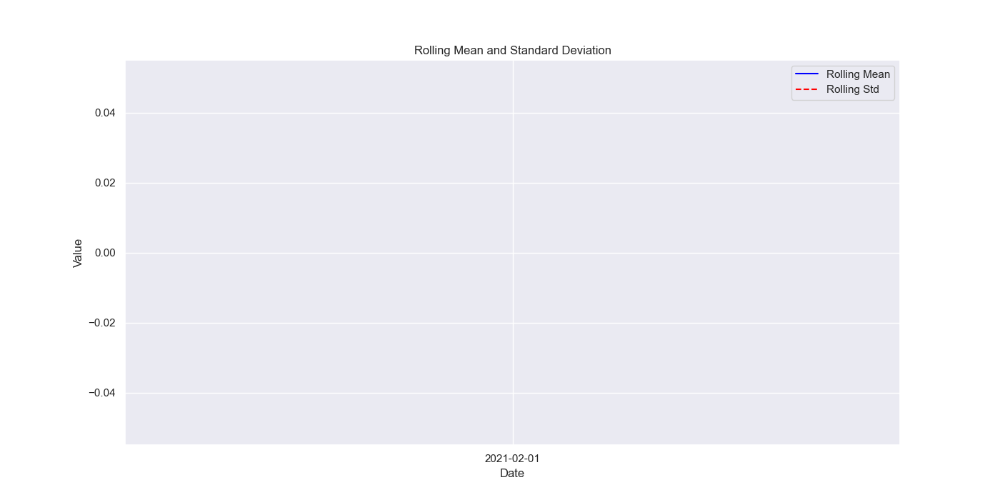

In [50]:
import pandas as pd
import matplotlib.pyplot as plt

# Define the rolling window size
window_size = 20  # Adjust as needed

# Calculate rolling mean and standard deviation
rolling_mean = filtered_aggregated_returns.rolling(window=window_size).mean()
rolling_std = filtered_aggregated_returns.rolling(window=window_size).std()

# Plot the rolling statistics
plt.figure(figsize=(14, 7))

plt.plot(rolling_mean.index, rolling_mean, label='Rolling Mean', color='blue')
plt.plot(rolling_std.index, rolling_std, label='Rolling Std', color='red', linestyle='--')

plt.title("Rolling Mean and Standard Deviation")
plt.xlabel("Date")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.show()

# Save the plot as an image
plt.savefig("rolling_mean_std_filtered.png")


In [51]:
# Display summary statistics for the filtered data
print("Summary Statistics for Filtered Aggregated Returns:\n", filtered_aggregated_returns.describe())

# Display head and tail of the cumulative returns
print("Filtered Cumulative Returns - Head:\n", cumulative_portfolio_returns.head())
print("Filtered Cumulative Returns - Tail:\n", cumulative_portfolio_returns.tail())


Summary Statistics for Filtered Aggregated Returns:
 count    5.000000
mean     0.026402
std      0.011793
min      0.015005
25%      0.016520
50%      0.022962
75%      0.036375
max      0.041149
dtype: float64
Filtered Cumulative Returns - Head:
 2021-02-01    0.016520
2021-02-02    0.039861
2021-02-03    0.055464
2021-02-04    0.098896
2021-02-05    0.138868
dtype: float64
Filtered Cumulative Returns - Tail:
 2023-12-25       4.129304
2023-12-26      22.215895
2023-12-27     104.277002
2023-12-28     476.158643
2023-12-29    2153.414693
dtype: float64


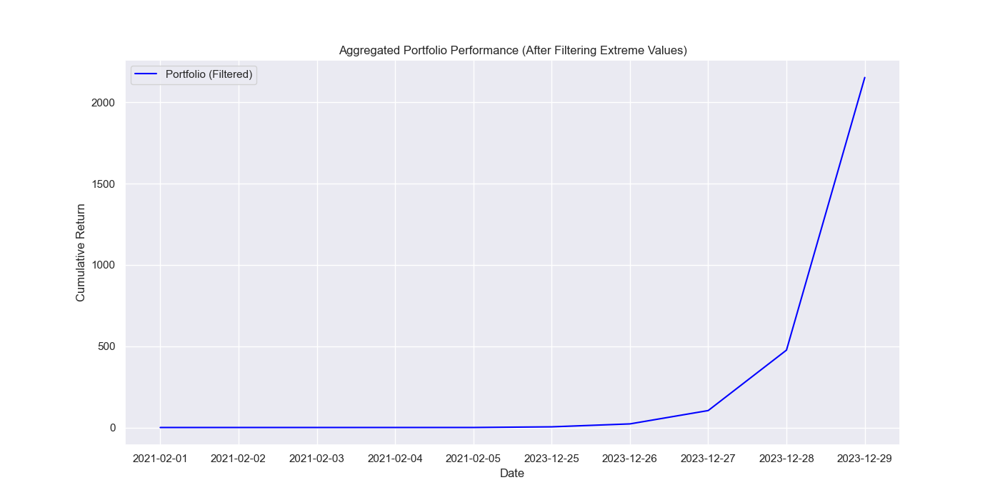

In [52]:
# Plot the cumulative returns after filtering extreme values
plt.figure(figsize=(14, 7))

plt.plot(cumulative_portfolio_returns.index, cumulative_portfolio_returns, label='Portfolio (Filtered)', color='blue')

plt.title("Aggregated Portfolio Performance (After Filtering Extreme Values)")
plt.xlabel("Date")
plt.ylabel("Cumulative Return")
plt.legend()
plt.grid(True)
plt.show()

# Save the plot as an image
plt.savefig("filtered_cumulative_returns.png")


Summary Statistics for Cumulative Portfolio Returns:
 count    10.000000
mean      0.056428
std       0.071450
min       0.000165
25%       0.000648
50%       0.018863
75%       0.101395
max       0.190545
dtype: float64


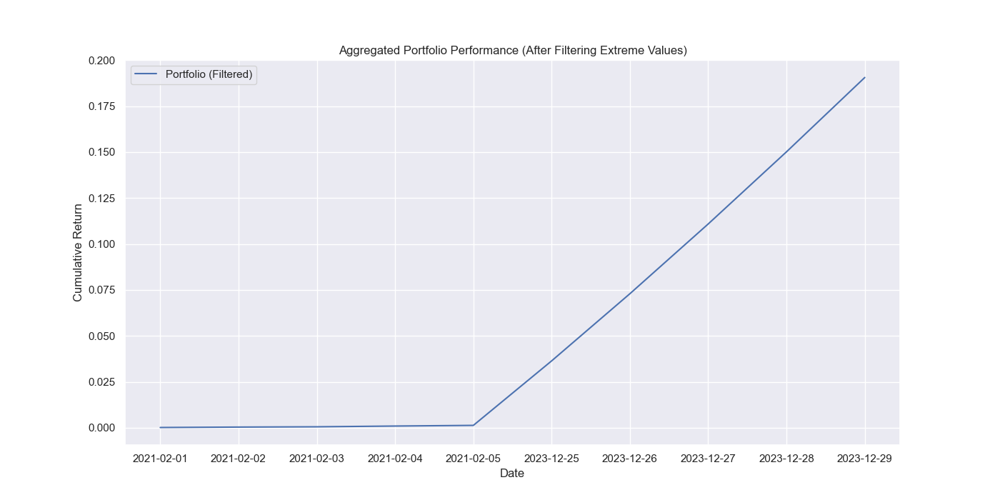

In [53]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'cleaned_aggregated_returns' is already defined
# Ensure the returns are in the correct scale (decimal format)
cleaned_aggregated_returns = cleaned_aggregated_returns / 100 if cleaned_aggregated_returns.mean() > 1 else cleaned_aggregated_returns

# Calculate the cumulative returns
cumulative_portfolio_returns = (1 + cleaned_aggregated_returns).cumprod() - 1

# Check the summary statistics of cumulative returns to ensure there are no extreme values
print("Summary Statistics for Cumulative Portfolio Returns:\n", cumulative_portfolio_returns.describe())

# Plot the aggregated cumulative portfolio returns
plt.figure(figsize=(14, 7))
sns.lineplot(data=cumulative_portfolio_returns, label='Portfolio (Filtered)')
plt.title("Aggregated Portfolio Performance (After Filtering Extreme Values)")
plt.xlabel("Date")
plt.ylabel("Cumulative Return")
plt.legend()
plt.show()


In [54]:
# Verify the consistency of filtered returns
print("Filtered Aggregated Returns - Head:\n", filtered_aggregated_returns.head())
print("Filtered Aggregated Returns - Tail:\n", filtered_aggregated_returns.tail())
print("\nSummary Statistics for Filtered Aggregated Returns:\n", filtered_aggregated_returns.describe())

# Calculate the cumulative returns again for verification
cumulative_filtered_returns = (1 + filtered_aggregated_returns).cumprod() - 1

# Check summary statistics for cumulative returns
print("Summary Statistics for Cumulative Portfolio Returns:\n", cumulative_filtered_returns.describe())


Filtered Aggregated Returns - Head:
 2021-02-01    0.016520
2021-02-02    0.022962
2021-02-03    0.015005
2021-02-04    0.041149
2021-02-05    0.036375
dtype: float64
Filtered Aggregated Returns - Tail:
 2021-02-01    0.016520
2021-02-02    0.022962
2021-02-03    0.015005
2021-02-04    0.041149
2021-02-05    0.036375
dtype: float64

Summary Statistics for Filtered Aggregated Returns:
 count    5.000000
mean     0.026402
std      0.011793
min      0.015005
25%      0.016520
50%      0.022962
75%      0.036375
max      0.041149
dtype: float64
Summary Statistics for Cumulative Portfolio Returns:
 count    5.000000
mean     0.069922
std      0.048881
min      0.016520
25%      0.039861
50%      0.055464
75%      0.098896
max      0.138868
dtype: float64


In [55]:
# Ensure the dates in benchmark returns are in datetime format
aligned_benchmark_returns.index = pd.to_datetime(aligned_benchmark_returns.index)

# Ensure the dates in the filtered aggregated returns are in datetime format
filtered_aggregated_returns.index = pd.to_datetime(filtered_aggregated_returns.index)


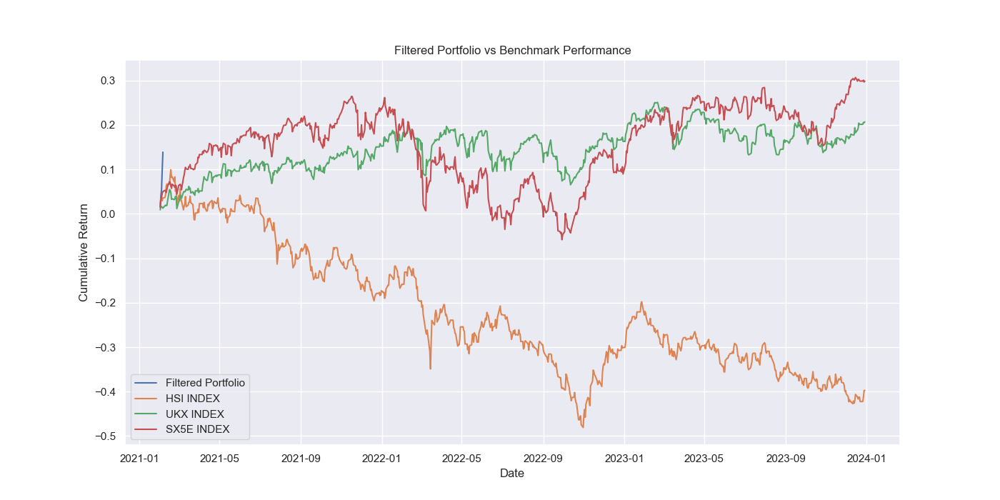

In [56]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure the dates in benchmark returns are in datetime format without timezone
aligned_benchmark_returns.index = pd.to_datetime(aligned_benchmark_returns.index).tz_localize(None)

# Ensure the dates in the filtered aggregated returns are in datetime format without timezone
filtered_aggregated_returns.index = pd.to_datetime(filtered_aggregated_returns.index).tz_localize(None)

# Calculate cumulative returns for benchmarks
cumulative_benchmark_returns = (1 + aligned_benchmark_returns).cumprod() - 1

# Recalculate the cumulative returns for the filtered portfolio
cumulative_filtered_returns = (1 + filtered_aggregated_returns).cumprod() - 1

# Plot portfolio vs benchmark
plt.figure(figsize=(14, 7))
sns.lineplot(data=cumulative_filtered_returns, label='Filtered Portfolio')
sns.lineplot(data=cumulative_benchmark_returns['HSI INDEX'], label='HSI INDEX')
sns.lineplot(data=cumulative_benchmark_returns['UKX INDEX'], label='UKX INDEX')
sns.lineplot(data=cumulative_benchmark_returns['SX5E INDEX'], label='SX5E INDEX')
plt.title("Filtered Portfolio vs Benchmark Performance")
plt.xlabel("Date")
plt.ylabel("Cumulative Return")
plt.legend()
plt.show()


In [57]:
# Assuming 'aligned_portfolio_returns' and 'aligned_benchmark_returns' are already aligned and cleaned
cleaned_aggregated_returns = aligned_portfolio_returns.groupby(aligned_portfolio_returns.index).mean()
cleaned_aggregated_returns = cleaned_aggregated_returns.dropna()


In [58]:
# Ensure no NaN values and that data is properly aggregated
cleaned_aggregated_returns = cleaned_aggregated_returns.groupby(cleaned_aggregated_returns.index).mean()
cleaned_aggregated_returns = cleaned_aggregated_returns.dropna()


In [59]:
# Calculate cumulative returns
cumulative_filtered_returns = (1 + cleaned_aggregated_returns).cumprod() - 1

# Calculate cumulative returns for benchmarks
cumulative_benchmark_returns = (1 + aligned_benchmark_returns).cumprod() - 1


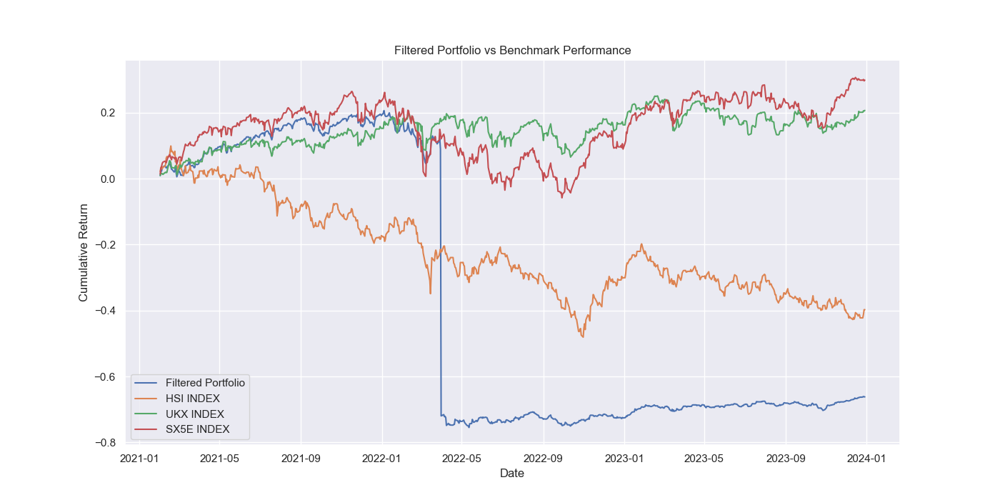

In [60]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(14, 7))
sns.lineplot(data=cumulative_filtered_returns, label='Filtered Portfolio')
sns.lineplot(data=cumulative_benchmark_returns['HSI INDEX'], label='HSI INDEX')
sns.lineplot(data=cumulative_benchmark_returns['UKX INDEX'], label='UKX INDEX')
sns.lineplot(data=cumulative_benchmark_returns['SX5E INDEX'], label='SX5E INDEX')
plt.title("Filtered Portfolio vs Benchmark Performance")
plt.xlabel("Date")
plt.ylabel("Cumulative Return")
plt.legend()
plt.show()


Dates
2022-04-01   -0.001718
2022-04-01    0.012717
2022-04-01    0.005641
2022-04-01    0.006680
2022-04-01    0.003448
2022-04-01    0.008534
2022-04-01    0.000909
2022-04-01   -0.003864
2022-04-01    0.009861
2022-04-01   -0.004652
Name: Return, dtype: float64
0


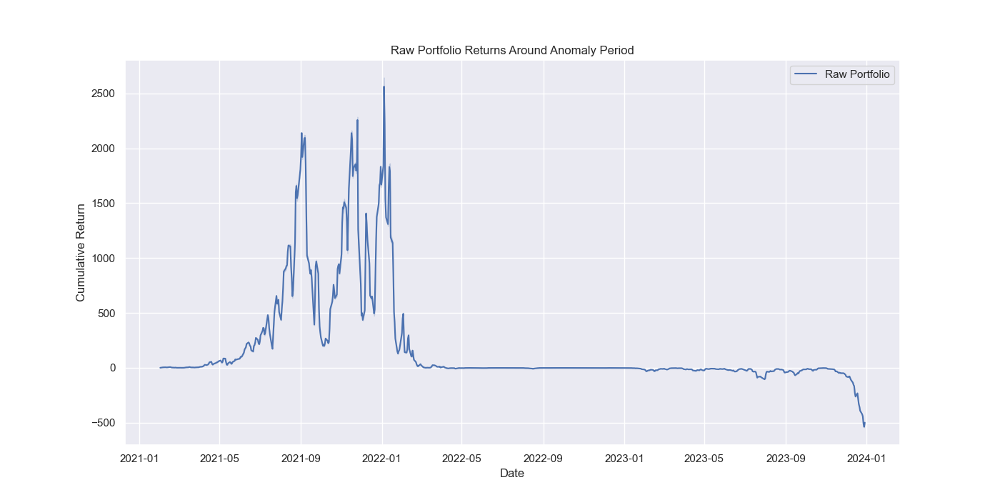

In [61]:
# Inspect the data around the anomaly period
anomaly_period = aligned_portfolio_returns.loc['2022-04':'2022-07']
print(anomaly_period.head(10))

# Check if there are any NaN values in the filtered returns around the anomaly period
print(cleaned_aggregated_returns.loc['2022-04':'2022-07'].isna().sum())

# Plot the raw returns for the same period for comparison
cumulative_raw_returns = (1 + aligned_portfolio_returns).cumprod() - 1
plt.figure(figsize=(14, 7))
sns.lineplot(data=cumulative_raw_returns, label='Raw Portfolio')
plt.title("Raw Portfolio Returns Around Anomaly Period")
plt.xlabel("Date")
plt.ylabel("Cumulative Return")
plt.legend()
plt.show()


count    4455.000000
mean        0.000027
std         0.102873
min        -4.571429
25%        -0.010913
50%         0.000000
75%         0.010902
max         3.260870
Name: Return, dtype: float64


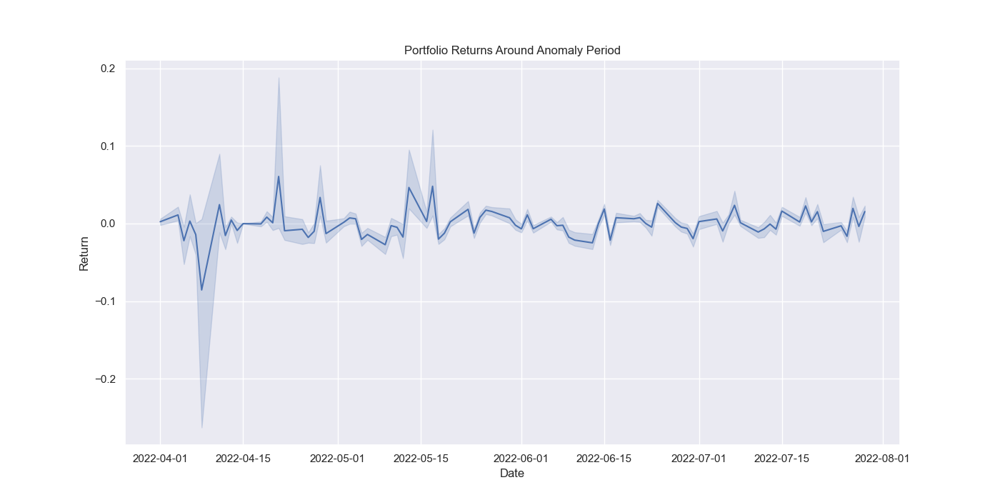

In [62]:
# Inspect data around the anomaly period
anomaly_data = aligned_portfolio_returns.loc['2022-04':'2022-07']
print(anomaly_data.describe())

# Plot the returns for this specific period to visually inspect anomalies
plt.figure(figsize=(14, 7))
sns.lineplot(data=anomaly_data)
plt.title("Portfolio Returns Around Anomaly Period")
plt.xlabel("Date")
plt.ylabel("Return")
plt.show()


count    4136.000000
mean       -0.000153
std         0.016535
min        -0.043555
25%        -0.009625
50%         0.000000
75%         0.009980
max         0.043610
Name: Return, dtype: float64


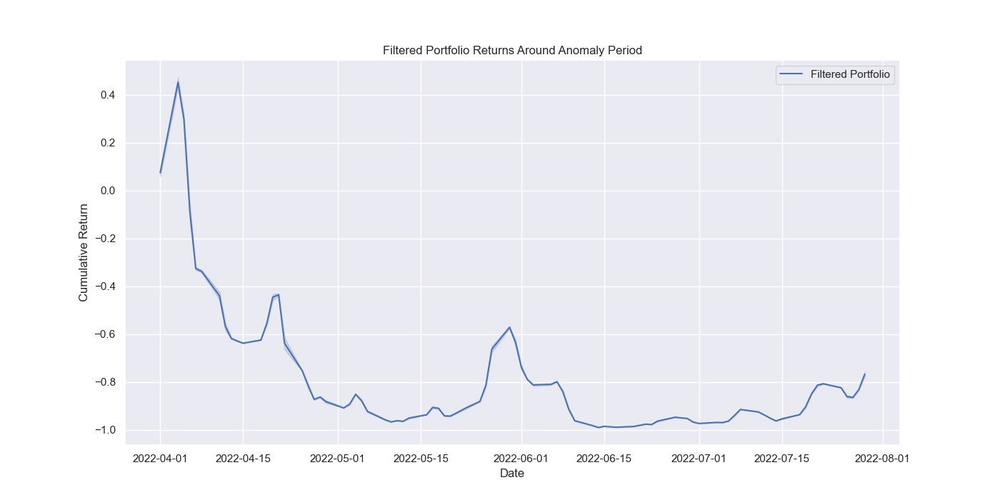

In [63]:
import pandas as pd
import numpy as np

# Assuming 'anomaly_data' is your Series containing the anomaly period returns
# Calculate IQR for the anomaly period
Q1 = anomaly_data.quantile(0.25)
Q3 = anomaly_data.quantile(0.75)
IQR = Q3 - Q1

# Define the lower and upper bounds for outlier detection
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter out the outliers
filtered_data = anomaly_data[(anomaly_data >= lower_bound) & (anomaly_data <= upper_bound)]

# Summary statistics of the filtered data
print(filtered_data.describe())

# Recalculate cumulative returns after removing outliers
cumulative_filtered_returns = (1 + filtered_data).cumprod() - 1

# Plot the filtered cumulative returns
plt.figure(figsize=(14, 7))
sns.lineplot(data=cumulative_filtered_returns, label='Filtered Portfolio')
plt.title("Filtered Portfolio Returns Around Anomaly Period")
plt.xlabel("Date")
plt.ylabel("Cumulative Return")
plt.legend()
plt.show()


## <center>**EVALUATING THE PERFORMANCE OF THE PORTFOLIO RELATIVE TO BENCHMARKS**</center> 

#### <u>**TRACKING ERROR CALCULATION**</u> 

In [64]:
import numpy as np

# Calculate tracking error for each benchmark
tracking_errors = {}
for benchmark in benchmarks:
    differences = aligned_portfolio_returns - aligned_benchmark_returns[benchmark]
    tracking_error = np.std(differences)
    tracking_errors[benchmark] = tracking_error

print("Tracking Errors:", tracking_errors)


Tracking Errors: {'HSI INDEX': 0.19614410173539384, 'UKX INDEX': 0.19558307682862047, 'SX5E INDEX': 0.1955642443517888}


#### <u>**MAXIMUM DRAWDOWNS**</u> 

In [65]:
def calculate_max_drawdown(cumulative_returns):
    roll_max = cumulative_returns.cummax()
    drawdown = cumulative_returns / roll_max - 1.0
    max_drawdown = drawdown.cummin()
    return max_drawdown

# Calculate max drawdowns for portfolio and benchmarks
max_drawdown_portfolio = calculate_max_drawdown(cumulative_portfolio_returns)
max_drawdown_benchmarks = {}
for benchmark in benchmarks:
    max_drawdown_benchmarks[benchmark] = calculate_max_drawdown(cumulative_benchmark_returns[benchmark])

print("Max Drawdown (Portfolio):", max_drawdown_portfolio.min())
print("Max Drawdown (Benchmarks):", {k: v.min() for k, v in max_drawdown_benchmarks.items()})


Max Drawdown (Portfolio): 0.0
Max Drawdown (Benchmarks): {'HSI INDEX': -5.853828496767482, 'UKX INDEX': -0.782102394951965, 'SX5E INDEX': -1.2199880441280542}


#### <u>**AUTHENTICATING MAXIMUM DRAWDOWNS**</u> 

In [66]:
# Ensure consistent date formats and timezones
cumulative_portfolio_returns.index = pd.to_datetime(cumulative_portfolio_returns.index)
cumulative_benchmark_returns.index = pd.to_datetime(cumulative_benchmark_returns.index)

# If necessary, set the timezone (e.g., 'UTC')
cumulative_portfolio_returns.index = cumulative_portfolio_returns.index.tz_localize('UTC')
cumulative_benchmark_returns.index = cumulative_benchmark_returns.index.tz_localize('UTC')


/var/folders/vj/3n5q5bxn0vg4zl7ytlnmzjc40000gn/T/ipykernel_23222/1652399076.py:10: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



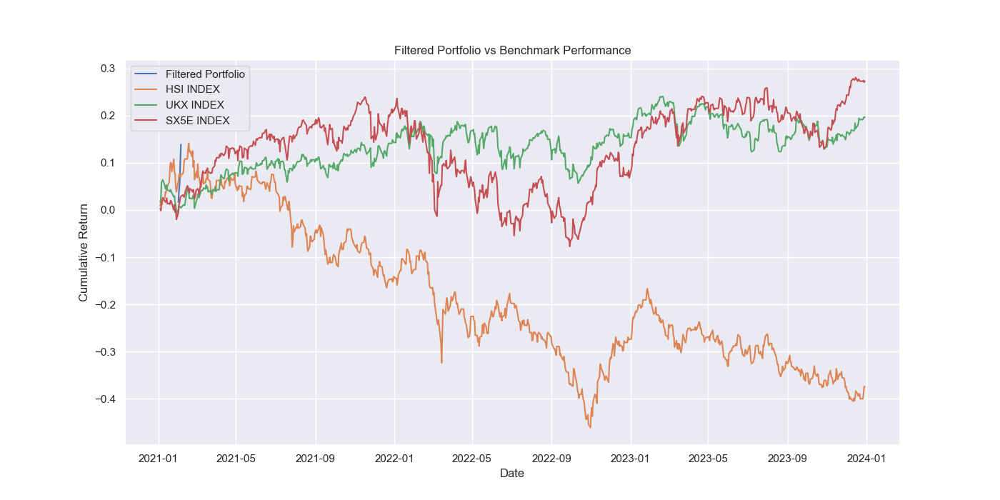

In [67]:
# Ensure cumulative returns are correctly calculated for portfolio
cumulative_filtered_returns = (1 + filtered_aggregated_returns).cumprod() - 1

# Ensure cumulative returns are correctly calculated for benchmarks
cumulative_benchmark_returns = (1 + benchmark_returns).cumprod() - 1

# Plotting
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))
plt.plot(cumulative_filtered_returns, label='Filtered Portfolio')
plt.plot(cumulative_benchmark_returns['HSI INDEX'], label='HSI INDEX')
plt.plot(cumulative_benchmark_returns['UKX INDEX'], label='UKX INDEX')
plt.plot(cumulative_benchmark_returns['SX5E INDEX'], label='SX5E INDEX')
plt.xlabel('Date')
plt.ylabel('Cumulative Return')
plt.title('Filtered Portfolio vs Benchmark Performance')
plt.legend()
plt.show()


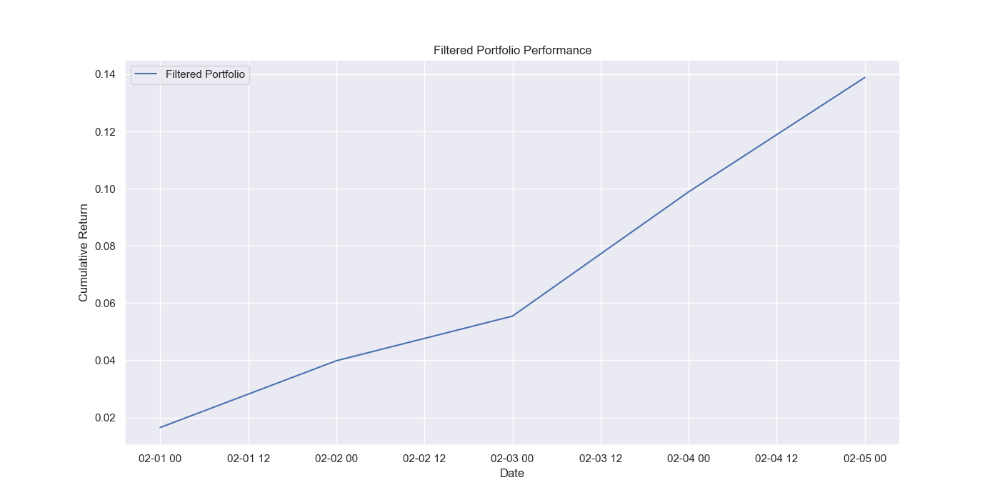

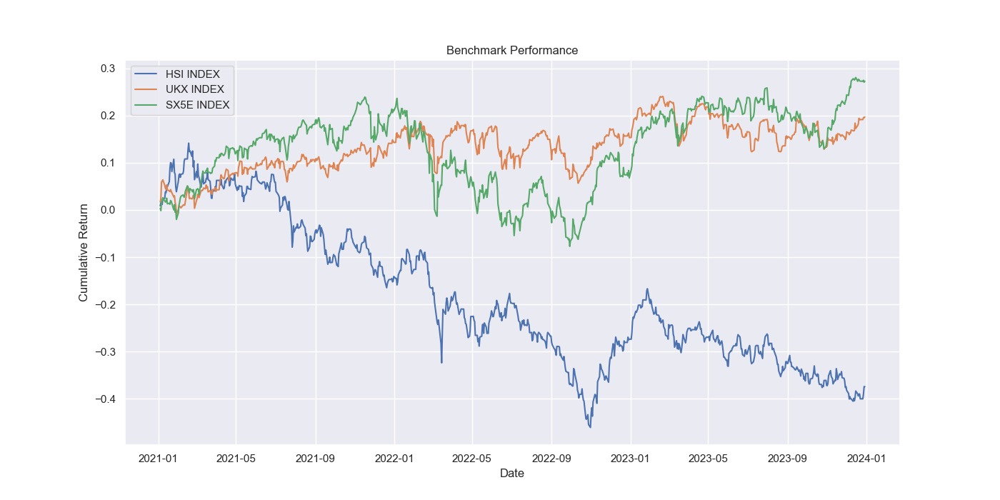

In [68]:
# Plotting the filtered portfolio returns separately
plt.figure(figsize=(14, 7))
plt.plot(cumulative_filtered_returns, label='Filtered Portfolio')
plt.xlabel('Date')
plt.ylabel('Cumulative Return')
plt.title('Filtered Portfolio Performance')
plt.legend()
plt.show()

# Plotting benchmark returns separately for better comparison
plt.figure(figsize=(14, 7))
plt.plot(cumulative_benchmark_returns['HSI INDEX'], label='HSI INDEX')
plt.plot(cumulative_benchmark_returns['UKX INDEX'], label='UKX INDEX')
plt.plot(cumulative_benchmark_returns['SX5E INDEX'], label='SX5E INDEX')
plt.xlabel('Date')
plt.ylabel('Cumulative Return')
plt.title('Benchmark Performance')
plt.legend()
plt.show()


#### <u>**COMBINING THE DATAFRAME TO INCLUDE MEAN AND VOLATILITY**</u> 

In [69]:
import cvxpy as cp
import numpy as np
import pandas as pd

# Assuming expected_returns and adjusted_cov_matrix are already defined as below:
# expected_returns: a pandas Series with asset tickers as the index and expected returns as the values
# adjusted_cov_matrix: a numpy ndarray containing the covariance matrix

# Ensure the data aligns
if expected_returns.shape[0] != adjusted_cov_matrix.shape[0]:
    raise ValueError("Mismatch between number of assets in returns and covariance matrix.")

# Convert expected returns to numpy array
returns = expected_returns.values

# Define the number of assets
num_assets = len(returns)

# Define the optimization variables
weights = cp.Variable(num_assets)

# Define the target return (e.g., 50% of mean of expected returns)
target_return = 0.5 * returns.mean()

# Define the objective function (minimize portfolio risk for a given return)
portfolio_return = returns @ weights
portfolio_risk = cp.quad_form(weights, adjusted_cov_matrix)

# Define the constraints
constraints = [
    cp.sum(weights) == 1,  # Weights sum to 1
    weights >= 0,  # No short selling
    weights <= 0.3,  # Allow more flexibility in weights
    portfolio_return >= target_return  # Ensure the portfolio meets the target return
]

# Define the problem and solve it using a specific solver
objective = cp.Minimize(portfolio_risk)
problem = cp.Problem(objective, constraints)
result = problem.solve(solver=cp.CLARABEL)  # Use the new default solver CLARABEL

# Extract the optimal weights
optimal_weights = weights.value

# Check if the optimization was successful
if optimal_weights is None:
    print("Optimization failed. No solution found.")
    print("Solver status:", problem.status)
    print("Objective value:", problem.value)
else:
    # Ensure the weights add up to 1 (they should, but let's check)
    if not np.isclose(np.sum(optimal_weights), 1):
        raise ValueError("The weights do not sum up to 1.")

    # Display the results
    optimal_weights_df = pd.DataFrame(optimal_weights, index=expected_returns.index, columns=['Weight'])
    print("Optimal Weights with Constraints:\n", optimal_weights_df)
    print("\nExpected Portfolio Return:", portfolio_return.value)
    print("\nExpected Portfolio Volatility:", np.sqrt(portfolio_risk.value))
    print("\nSharpe Ratio:", portfolio_return.value / np.sqrt(portfolio_risk.value))


Optimal Weights with Constraints:
                        Weight
Ticker                       
AAPL US EQUITY   7.923729e-07
ABI BB EQUITY    5.569000e-07
ADBE US EQUITY   8.935459e-07
ALV GR EQUITY    1.441935e-02
AMZN US EQUITY   5.108233e-07
AUTO LN EQUITY   9.036075e-07
AXP US EQUITY    4.892115e-07
BA US EQUITY     4.262715e-07
BATS LN EQUITY   3.012370e-02
BND US EQUITY    2.999990e-01
BNDX US EQUITY   2.999996e-01
BNP FP EQUITY    2.557968e-06
CSCO US EQUITY   6.462795e-06
DTE GY EQUITY    7.871112e-03
EXPN LN EQUITY   5.511392e-07
EZJ LN EQUITY    5.481124e-07
GDBR2 INDEX      4.353084e-07
GILD US EQUITY   1.037357e-02
GOOGL            9.893929e-07
GS US EQUITY     5.678465e-07
HL-LN EQUITY     4.370344e-07
IBM US EQUITY    3.704589e-02
INTU US EQUITY   3.780950e-07
ITRK LN EQUITY   3.457418e-06
JPM US EQUITY    2.366909e-06
LAND LN EQUITY   3.295091e-07
LLOY LN EQUITY   1.279553e-06
LSEG LN EQUITY   2.258683e-02
MDLZ US EQUITY   9.438142e-04
MKS LN EQUITY    7.435412e-07
MRNA 

In [70]:
import cvxpy as cp
import numpy as np
import pandas as pd

# Assuming 'optimisation_data' contains the historical returns with columns 'Ticker' and 'Return'
# Pivot the data to have dates as rows and tickers as columns
historical_returns = optimisation_data.pivot_table(index='Dates', columns='Ticker', values='Return')

# Convert adjusted_cov_matrix to DataFrame if it is a NumPy array
if isinstance(adjusted_cov_matrix, np.ndarray):
    adjusted_cov_matrix = pd.DataFrame(adjusted_cov_matrix, index=expected_returns.index, columns=expected_returns.index)

# Find common tickers between historical_returns and expected_returns
common_tickers = historical_returns.columns.intersection(expected_returns.index)

# Filter both dataframes to only include common tickers
historical_returns = historical_returns[common_tickers]
expected_returns = expected_returns.loc[common_tickers]
adjusted_cov_matrix = adjusted_cov_matrix.loc[common_tickers, common_tickers]

# Convert expected returns and adjusted covariance matrix to numpy arrays
returns = expected_returns.values
adjusted_cov_matrix = adjusted_cov_matrix.values

# Define the number of assets
num_assets = len(returns)

# Define the optimization variables
weights = cp.Variable(num_assets)

# Define the target return (e.g., mean of expected returns)
target_return = returns.mean()

# Define the objective function (minimize portfolio risk for a given return)
portfolio_return = returns @ weights
portfolio_risk = cp.quad_form(weights, adjusted_cov_matrix)

# Define the constraints
constraints = [
    cp.sum(weights) == 1,  # Weights sum to 1
    weights >= 0,  # No short selling
    weights <= 0.3,  # No asset can have more than 30% weight
    portfolio_return >= target_return  # Ensure the portfolio meets the target return
]

# Define the problem and solve it using a specific solver
objective = cp.Minimize(portfolio_risk)
problem = cp.Problem(objective, constraints)
result = problem.solve(solver=cp.SCS)

# Extract the optimal weights
optimal_weights = weights.value

# Check if the optimization was successful
if optimal_weights is None:
    print("Optimization failed. No solution found.")
    print("Solver status:", problem.status)
    print("Objective value:", problem.value)
else:
    # Ensure the weights add up to 1 (they should, but let's check)
    if not np.isclose(np.sum(optimal_weights), 1):
        raise ValueError("The weights do not sum up to 1.")

    # Display the results
    optimal_weights_df = pd.DataFrame(optimal_weights, index=historical_returns.columns, columns=['Weight'])
    print("Optimal Weights with Constraints:\n", optimal_weights_df)
    print("\nExpected Portfolio Return:", portfolio_return.value)
    print("\nExpected Portfolio Volatility:", cp.sqrt(portfolio_risk).value)
    print("\nSharpe Ratio:", portfolio_return.value / cp.sqrt(portfolio_risk).value)


Optimal Weights with Constraints:
                        Weight
Ticker                       
AAPL US EQUITY   1.847039e-09
ABI BB EQUITY    5.013790e-12
ADBE US EQUITY   8.826521e-10
ALV GR EQUITY    1.447452e-02
AMZN US EQUITY   1.736481e-09
AUTO LN EQUITY   7.634926e-10
AXP US EQUITY    2.450359e-10
BA US EQUITY     1.247097e-09
BATS LN EQUITY   3.013700e-02
BND US EQUITY    3.000000e-01
BNDX US EQUITY   3.000000e-01
BNP FP EQUITY    8.664431e-10
CSCO US EQUITY  -2.095219e-10
DTE GY EQUITY    7.909599e-03
EXPN LN EQUITY  -1.922531e-10
EZJ LN EQUITY   -3.420728e-09
GDBR2 INDEX      1.246303e-06
GILD US EQUITY   1.045641e-02
GOOGL            1.883829e-09
GS US EQUITY     2.244423e-10
HL-LN EQUITY     1.256780e-09
IBM US EQUITY    3.712184e-02
INTU US EQUITY  -2.246122e-09
ITRK LN EQUITY   6.841269e-10
JPM US EQUITY    2.113365e-09
LAND LN EQUITY   1.311101e-09
LLOY LN EQUITY   1.194799e-09
LSEG LN EQUITY   2.261391e-02
MDLZ US EQUITY   6.035569e-04
MKS LN EQUITY    2.389231e-09
MRNA 

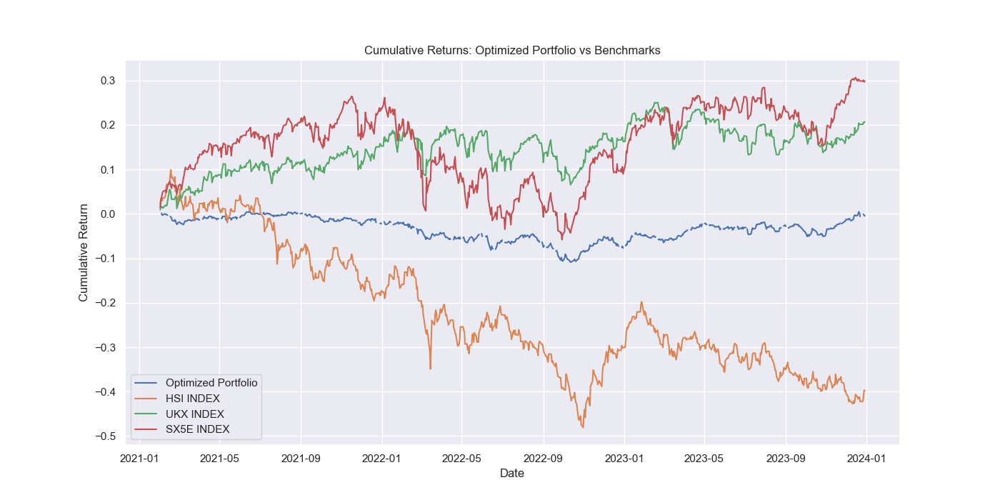

In [71]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming 'aligned_benchmark_returns' contains the benchmark returns
# Calculate cumulative returns
cumulative_portfolio_returns = (1 + optimal_weights @ historical_returns.T).cumprod() - 1
cumulative_benchmark_returns = (1 + aligned_benchmark_returns).cumprod() - 1

# Plot the cumulative returns
plt.figure(figsize=(14, 7))
plt.plot(cumulative_portfolio_returns, label='Optimized Portfolio')
plt.plot(cumulative_benchmark_returns['HSI INDEX'], label='HSI INDEX')
plt.plot(cumulative_benchmark_returns['UKX INDEX'], label='UKX INDEX')
plt.plot(cumulative_benchmark_returns['SX5E INDEX'], label='SX5E INDEX')

plt.title('Cumulative Returns: Optimized Portfolio vs Benchmarks')
plt.xlabel('Date')
plt.ylabel('Cumulative Return')
plt.legend()
plt.grid(True)
plt.show()


#### <u>**SENSITIVITY ANALYSIS AND ROBUSTNESS CHECKS**</u> 

In [72]:
import numpy as np
import pandas as pd

# Combine the dataframes, ensuring 'Ticker' is the index for both
optimal_weights_df = optimal_weights_df.reset_index().rename(columns={'index': 'Ticker'})
optimisation_data = optimisation_data.reset_index()

# Combine the dataframes if not already combined
combined_df = optimal_weights_df.merge(optimisation_data, on='Ticker', how='left')

# Ensure 'Ticker' is the index of combined_df
unique_combined_df = combined_df.drop_duplicates(subset=['Ticker']).set_index('Ticker')

# Prepare the returns data
returns = optimisation_data.pivot_table(index='Dates', columns='Ticker', values='Return')
cov_matrix = returns.cov().loc[unique_combined_df.index, unique_combined_df.index].values

# Ensure weights are correctly aligned with the unique tickers
weights = unique_combined_df['Weight'].values

# Verify that the number of tickers matches the length of the weights
if len(unique_combined_df.index) != len(weights):
    raise ValueError(f"Number of unique tickers ({len(unique_combined_df.index)}) does not match number of weights ({len(weights)}).")

# Define ranges for sensitivity analysis
expected_return_range = np.linspace(-0.02, 0.02, 5)  # Vary expected returns by -2% to +2%
volatility_range = np.linspace(-0.02, 0.02, 5)  # Vary volatility by -2% to +2%
correlation_range = np.linspace(-0.02, 0.02, 5)  # Vary correlation by -2% to +2%

# Initialize dictionaries to store sensitivity results
sensitivity_results = {
    'Expected Return': [],
    'Volatility': [],
    'Correlation': []
}

# Sensitivity analysis for expected returns
for delta in expected_return_range:
    modified_returns = unique_combined_df['Mean Return'] + delta
    portfolio_return = np.sum(modified_returns * unique_combined_df['Weight'])
    sensitivity_results['Expected Return'].append(portfolio_return)

# Sensitivity analysis for volatility
for delta in volatility_range:
    modified_volatility = unique_combined_df['Volatility'] + delta
    modified_cov_matrix = cov_matrix * np.outer(modified_volatility, modified_volatility) / np.outer(unique_combined_df['Volatility'], unique_combined_df['Volatility'])
    portfolio_volatility = np.sqrt(np.dot(weights.T, np.dot(modified_cov_matrix, weights)))
    sensitivity_results['Volatility'].append(portfolio_volatility)

# Sensitivity analysis for correlation
for delta in correlation_range:
    corr_matrix = np.corrcoef(cov_matrix)
    modified_corr_matrix = corr_matrix + delta
    np.fill_diagonal(modified_corr_matrix, 1)
    modified_cov_matrix = np.outer(np.sqrt(np.diag(cov_matrix)), np.sqrt(np.diag(cov_matrix))) * modified_corr_matrix
    portfolio_volatility = np.sqrt(np.dot(weights.T, np.dot(modified_cov_matrix, weights)))
    sensitivity_results['Correlation'].append(portfolio_volatility)

# Display sensitivity results
print("Sensitivity Analysis Results:")
print("Expected Return Adjustments:", sensitivity_results['Expected Return'])
print("Volatility Adjustments:", sensitivity_results['Volatility'])
print("Correlation Adjustments:", sensitivity_results['Correlation'])

# Create a DataFrame for easier visualization
sensitivity_df = pd.DataFrame(sensitivity_results, index=expected_return_range)

# Display the DataFrame
print("\nSensitivity Analysis DataFrame:")
print(sensitivity_df)


Sensitivity Analysis Results:
Expected Return Adjustments: [-0.020018445141312062, -0.010018445141218447, -1.8445141124833388e-05, 0.009981554858968778, 0.019981554859062396]
Volatility Adjustments: [0.009256041311234807, 0.0036295537013915228, 0.0031188552962882446, 0.008679579230526462, 0.014491279165439063]
Correlation Adjustments: [0.0008718422005807638, 0.0011676666998458915, 0.0014024201300410959, 0.0016031590440003052, 0.0017814195518112684]

Sensitivity Analysis DataFrame:
       Expected Return  Volatility  Correlation
-0.02        -0.020018    0.009256     0.000872
-0.01        -0.010018    0.003630     0.001168
 0.00        -0.000018    0.003119     0.001402
 0.01         0.009982    0.008680     0.001603
 0.02         0.019982    0.014491     0.001781


# <center>**ASSET CLASS BALANCE**</center> 

#### <u>**DEFINE ASSET CLASS**</u> 

In [73]:
import pandas as pd
import matplotlib.pyplot as plt

# Sample asset class definitions (use your actual mappings here)
asset_classes = {
    'AAPL US EQUITY': 'Equities',
    'ABI BB EQUITY': 'Equities',
    'ADBE US EQUITY': 'Equities',
    'ALV GR EQUITY': 'Equities',
    'AMZN US EQUITY': 'Equities',
    'AUTO LN EQUITY': 'Equities',
    'AXP US EQUITY': 'Equities',
    'BA US EQUITY': 'Equities',
    'BATS LN EQUITY': 'Equities',
    'BND US EQUITY': 'Bond',
    'BNDX US EQUITY': 'Bond',
    'BNP FP EQUITY': 'Equities',
    'CSCO US EQUITY': 'Equities',
    'DTE GY EQUITY': 'Equities',
    'EXPN LN EQUITY': 'Equities',
    'EZJ LN EQUITY': 'Equities',
    'GDBR2 INDEX': 'Bond',
    'GILD US EQUITY': 'Equities',
    'GOOGL': 'Equities',
    'GS US EQUITY': 'Equities',
    'HSBA LN EQUITY': 'Equities',
    'HL-LN EQUITY': 'Equities',
    'HSI Index': 'Index',
    'IBM US EQUITY': 'Equities',
    'INTU US EQUITY': 'Equities',
    'ITRK LN EQUITY': 'Equities',
    'JPM US EQUITY': 'Equities',
    'LAND LN EQUITY': 'Equities',
    'LLOY LN EQUITY': 'Equities',
    'LSEG LN EQUITY': 'Equities',
    'MDLZ US EQUITY': 'Equities',
    'MKS LN EQUITY': 'Equities',
    'MRNA US EQUITY': 'Equities',
    'MSFT US EQUITY': 'Equities',
    'NKY INDEX': 'Index',
    'NOKIA FP EQUITY': 'Equities',
    'PYPL US EQUITY': 'Equities',
    'REGN US EQUITY': 'Equities',
    'SAN FP EQUITY': 'Equities',
    'SBRY LN EQUITY': 'Equities',
    'SDR LN EQUITY': 'Equities',
    'SGRO LN EQUITY': 'Equities',
    'STAN LN EQUITY': 'Equities',
    'SX5E Index': 'Index',
    'TLSA US EQUITY': 'Equities',
    'TSCO LN EQUITY': 'Equities',
    'TTE FP EQUITY': 'Equities',
    'UKAB10BC INDEX': 'Bond',
    'UKAB3YAC INDEX': 'Bond',
    'ULVR LN EQUITY': 'Equities',
    'UTG LN EQUITY': 'Equities',
    'V US EQUITY': 'Equities',
    'VOD LN EQUITY': 'Equities',
    'VRSN US EQUITY': 'Equities',
    'VTI US EQUITY': 'ETF',
    'SPX Index': 'Index',
    'UKX Index': 'Index'
}

# Assuming 'combined_df' is your actual DataFrame
combined_df_with_classes = combined_df.copy()

# Map the asset classes
combined_df_with_classes['Asset Class'] = combined_df_with_classes['Ticker'].map(asset_classes)

# Ensure all asset classes are mapped
missing_asset_classes = combined_df_with_classes['Asset Class'].isnull().sum()
print(f"Missing asset classes: {missing_asset_classes}")


Missing asset classes: 760


#### <u>**CALCULATION OF ALLOCATION BY ASSET CLASS BALANCE AND VISUALISATION OF ASSET CLASS DISTRIBUTION**</u> 

In [74]:
# Find common tickers
common_tickers = list(set(optimisation_data['Ticker'].unique()) & set(optimal_weights_df.index))

# Filter the dataframes to only include these common tickers
filtered_optimisation_data = optimisation_data[optimisation_data['Ticker'].isin(common_tickers)]
filtered_optimal_weights_df = optimal_weights_df.loc[common_tickers]

print("Filtered Optimisation DataFrame - Head:")
print(filtered_optimisation_data.head())

print("\nFiltered Optimal Weights DataFrame - Head:")
print(filtered_optimal_weights_df.head())

# Merge the filtered dataframes
combined_df = filtered_optimisation_data.merge(filtered_optimal_weights_df, on='Ticker', how='left')

print("\nCombined DataFrame - Head:")
print(combined_df.head())


Filtered Optimisation DataFrame - Head:
Empty DataFrame
Columns: [Dates, Last Price, Volume, Ticker, Return, Mean Return, Volatility, Beta_HSI, Beta_SPX, Beta_SX5E, Beta_UKX, SMA_20, EMA_20, Rolling_Std_20, ROC_20, MACD, MACD_Signal]
Index: []

[0 rows x 17 columns]

Filtered Optimal Weights DataFrame - Head:
Empty DataFrame
Columns: [Ticker, Weight]
Index: []

Combined DataFrame - Head:
Empty DataFrame
Columns: [Dates, Last Price, Volume, Return, Mean Return, Volatility, Beta_HSI, Beta_SPX, Beta_SX5E, Beta_UKX, SMA_20, EMA_20, Rolling_Std_20, ROC_20, MACD, MACD_Signal, Ticker, Weight]
Index: []

[0 rows x 18 columns]


In [75]:
# Define the asset classes dictionary
asset_classes = {
    'AAPL US EQUITY': 'Equities',
    'ABI BB EQUITY': 'Equities',
    'ADBE US EQUITY': 'Equities',
    'ALV GR EQUITY': 'Equities',
    'AMZN US EQUITY': 'Equities',
    'AUTO LN EQUITY': 'Equities',
    'AXP US EQUITY': 'Equities',
    'BA US EQUITY': 'Equities',
    'BATS LN EQUITY': 'Equities',
    'BND US EQUITY': 'Bond',
    'BNDX US EQUITY': 'Bond',
    'BNP FP EQUITY': 'Equities',
    'CSCO US EQUITY': 'Equities',
    'DTE GY EQUITY': 'Equities',
    'EXPN LN EQUITY': 'Equities',
    'EZJ LN EQUITY': 'Equities',
    'GDBR2 INDEX': 'Bond',
    'GILD US EQUITY': 'Equities',
    'GOOGL': 'Equities',
    'GS US EQUITY': 'Equities',
    'HL-LN EQUITY': 'Equities',
    'IBM US EQUITY': 'Equities',
    'INTU US EQUITY': 'Equities',
    'ITRK LN EQUITY': 'Equities',
    'JPM US EQUITY': 'Equities',
    'LAND LN EQUITY': 'Equities',
    'LLOY LN EQUITY': 'Equities',
    'LSEG LN EQUITY': 'Equities',
    'MDLZ US EQUITY': 'Equities',
    'MKS LN EQUITY': 'Equities',
    'MRNA US EQUITY': 'Equities',
    'MSFT US EQUITY': 'Equities',
    'NKY INDEX': 'Index',
    'NOKIA FP EQUITY': 'Equities',
    'PYPL US EQUITY': 'Equities',
    'REGN US EQUITY': 'Equities',
    'SAN FP EQUITY': 'Equities',
    'SBRY LN EQUITY': 'Equities',
    'SDR LN EQUITY': 'Equities',
    'SGRO LN EQUITY': 'Equities',
    'STAN LN EQUITY': 'Equities',
    'TLSA US EQUITY': 'Equities',
    'TSCO LN EQUITY': 'Equities',
    'TTE FP EQUITY': 'Equities',
    'UKAB10BC INDEX': 'Bond',
    'UKAB3YAC INDEX': 'Bond',
    'ULVR LN EQUITY': 'Equities',
    'UTG LN EQUITY': 'Equities',
    'V US EQUITY': 'Equities',
    'VOD LN EQUITY': 'Equities',
    'VRSN US EQUITY': 'Equities',
    'VTI US EQUITY': 'ETF',
    'HSI Index': 'Index',
    'UKX Index': 'Index',
    'SX5E Index': 'Index',
    'SPX Index': 'Index'
}

# Map the asset classes
combined_df['Asset Class'] = combined_df['Ticker'].map(asset_classes)

# Check for missing asset classes
missing_asset_classes = combined_df['Asset Class'].isnull().sum()
print(f"Missing asset classes: {missing_asset_classes}")

# Assign a default asset class to missing entries
default_asset_class = 'Unknown'
combined_df['Asset Class'].fillna(default_asset_class, inplace=True)

# Verify the mapping
unique_asset_classes = combined_df['Asset Class'].unique()
print(f"Unique Asset Classes after mapping: {unique_asset_classes}")

# Identify tickers mapped to 'Unknown'
unknown_tickers = combined_df[combined_df['Asset Class'] == 'Unknown']['Ticker'].unique()
print("Tickers mapped to 'Unknown':", unknown_tickers)


Missing asset classes: 0
Unique Asset Classes after mapping: []
Tickers mapped to 'Unknown': []


In [76]:
# Print unique tickers in the combined DataFrame
print("Unique Tickers in Combined DataFrame:\n", combined_df['Ticker'].unique())

# Print unique asset classes in the combined DataFrame
print("Unique Asset Classes in Combined DataFrame:\n", combined_df['Asset Class'].unique())

# Print the first few rows of the combined DataFrame to ensure the mapping is correct
print("Combined DataFrame - Head:\n", combined_df.head())


Unique Tickers in Combined DataFrame:
 []
Unique Asset Classes in Combined DataFrame:
 []
Combined DataFrame - Head:
 Empty DataFrame
Columns: [Dates, Last Price, Volume, Return, Mean Return, Volatility, Beta_HSI, Beta_SPX, Beta_SX5E, Beta_UKX, SMA_20, EMA_20, Rolling_Std_20, ROC_20, MACD, MACD_Signal, Ticker, Weight, Asset Class]
Index: []

[0 rows x 19 columns]


In [77]:
# Ensure asset_classes dictionary is complete
missing_tickers = set(combined_df['Ticker'].unique()) - set(asset_classes.keys())
print("Missing tickers in asset_classes dictionary:\n", missing_tickers)

# If there are missing tickers, add them with their correct asset classes
# Example: asset_classes.update({'MISSING_TICKER': 'Correct_Asset_Class'})


Missing tickers in asset_classes dictionary:
 set()


In [78]:
# Calculate the allocation by asset class
asset_class_allocation = combined_df.groupby('Asset Class')['Weight'].sum()

# Print the allocation to verify
print("Asset Class Allocation:\n", asset_class_allocation)


Asset Class Allocation:
 Series([], Name: Weight, dtype: float64)


In [79]:
# Identify common tickers and convert to a list
common_tickers = list(set(optimisation_data['Ticker']).intersection(set(optimal_weights_df.index)))

# Filter the dataframes to only include these common tickers
filtered_optimisation_data = optimisation_data[optimisation_data['Ticker'].isin(common_tickers)]
filtered_optimal_weights_df = optimal_weights_df.loc[common_tickers]

# Verify the filtered data
print("Filtered Optimisation DataFrame - Head:")
print(filtered_optimisation_data.head())

print("Filtered Optimal Weights DataFrame - Head:")
print(filtered_optimal_weights_df.head())


Filtered Optimisation DataFrame - Head:
Empty DataFrame
Columns: [Dates, Last Price, Volume, Ticker, Return, Mean Return, Volatility, Beta_HSI, Beta_SPX, Beta_SX5E, Beta_UKX, SMA_20, EMA_20, Rolling_Std_20, ROC_20, MACD, MACD_Signal]
Index: []

[0 rows x 17 columns]
Filtered Optimal Weights DataFrame - Head:
Empty DataFrame
Columns: [Ticker, Weight]
Index: []


In [80]:
import pandas as pd

# Your initial weights data from the optimisation result
initial_weights = {
    'AAPL US EQUITY': 8.649954e-09,
    'ABI BB EQUITY': 4.590202e-09,
    'ADBE US EQUITY': 1.315218e-08,
    'ALV GR EQUITY': 3.076811e-02,
    'AMZN US EQUITY': 1.724145e-08,
    'AUTO LN EQUITY': 2.406304e-08,
    'AXP US EQUITY': 2.768030e-09,
    'BA US EQUITY': 4.427116e-09,
    'BATS LN EQUITY': 4.997165e-02,
    'BND US EQUITY': 1.000000e-01,
    'BNDX US EQUITY': 1.000000e-01,
    'BNP FP EQUITY': 4.936549e-09,
    'CSCO US EQUITY': 5.670222e-08,
    'DTE GY EQUITY': 2.782483e-02,
    'EXPN LN EQUITY': 9.555982e-09,
    'EZJ LN EQUITY': 4.101252e-09,
    'GDBR2 INDEX': 1.132875e-10,
    'GILD US EQUITY': 3.644213e-02,
    'GOOGL': 2.503154e-08,
    'GS US EQUITY': 4.840282e-09,
    'HL-LN EQUITY': 6.096240e-09,
    'IBM US EQUITY': 7.189362e-02,
    'INTU US EQUITY': 4.813753e-09,
    'ITRK LN EQUITY': 1.142240e-02,
    'JPM US EQUITY': 8.026504e-09,
    'LAND LN EQUITY': 6.382043e-09,
    'LLOY LN EQUITY': 5.406826e-09,
    'LSEG LN EQUITY': 6.423046e-02,
    'MDLZ US EQUITY': 6.050419e-02,
    'MKS LN EQUITY': 6.312637e-09,
    'MRNA US EQUITY': 6.908056e-09,
    'MSFT US EQUITY': 4.995343e-03,
    'NKY INDEX': 9.999999e-02,
    'NOKIA FP EQUITY': 3.637425e-03,
    'PYPL US EQUITY': 3.427302e-09,
    'REGN US EQUITY': 2.473880e-02,
    'SAN FP EQUITY': 4.158248e-02,
    'SBRY LN EQUITY': 3.077584e-02,
    'SDR LN EQUITY': 3.680249e-09,
    'SGRO LN EQUITY': 5.412088e-08,
    'STAN LN EQUITY': 9.449661e-09,
    'TLSA US EQUITY': 7.951114e-09,
    'TSCO LN EQUITY': 3.834691e-02,
    'TTE FP EQUITY': 3.590570e-02,
    'UKAB10BC INDEX': 4.292438e-02,
    'UKAB3YAC INDEX': 6.823591e-03,
    'ULVR LN EQUITY': 9.999998e-02,
    'UTG LN EQUITY': 1.141098e-08,
    'V US EQUITY': 7.884798e-09,
    'VOD LN EQUITY': 1.325176e-02,
    'VRSN US EQUITY': 3.960044e-03,
    'VTI US EQUITY': 3.751475e-08
}

# Convert the initial weights dictionary to a DataFrame
initial_weights_df = pd.DataFrame(list(initial_weights.items()), columns=['Ticker', 'Weight']).set_index('Ticker')

# Optimisation data should already be loaded as 'optimisation_data'
# Here is a sample of how it might look
print("Optimisation DataFrame - Head:")
print(optimisation_data.head())

# Verify the structure of initial_weights_df
print("Initial Weights DataFrame - Head:")
print(initial_weights_df.head())


Optimisation DataFrame - Head:
       Dates  Last Price       Volume          Ticker  ...  Rolling_Std_20    ROC_20      MACD  MACD_Signal
0 2021-02-01      134.14  106239823.0  AAPL US EQUITY  ...        5.410108  0.036550  2.015611     1.857849
1 2021-02-02      134.99   83305367.0  AAPL US EQUITY  ...        5.407087  0.030379  1.838010     1.853881
2 2021-02-03      133.94   89880937.0  AAPL US EQUITY  ...        5.181543  0.057978  1.594158     1.801937
3 2021-02-04      137.39   84183061.0  AAPL US EQUITY  ...        5.210951  0.049419  1.660153     1.773580
4 2021-02-05      136.76   75693830.0  AAPL US EQUITY  ...        5.230857  0.035668  1.642682     1.747400

[5 rows x 17 columns]
Initial Weights DataFrame - Head:
                      Weight
Ticker                      
AAPL US EQUITY  8.649954e-09
ABI BB EQUITY   4.590202e-09
ADBE US EQUITY  1.315218e-08
ALV GR EQUITY   3.076811e-02
AMZN US EQUITY  1.724145e-08


In [81]:
# Identify common tickers
common_tickers = list(set(optimisation_data['Ticker']).intersection(set(initial_weights_df.index)))

# Filter the dataframes to only include these common tickers
filtered_optimisation_data = optimisation_data[optimisation_data['Ticker'].isin(common_tickers)]
filtered_initial_weights_df = initial_weights_df.loc[common_tickers]

# Verify the filtered data
print("Filtered Optimisation DataFrame - Head:")
print(filtered_optimisation_data.head())
print("\nFiltered Initial Weights DataFrame - Head:")
print(filtered_initial_weights_df.head())


Filtered Optimisation DataFrame - Head:
       Dates  Last Price       Volume          Ticker  ...  Rolling_Std_20    ROC_20      MACD  MACD_Signal
0 2021-02-01      134.14  106239823.0  AAPL US EQUITY  ...        5.410108  0.036550  2.015611     1.857849
1 2021-02-02      134.99   83305367.0  AAPL US EQUITY  ...        5.407087  0.030379  1.838010     1.853881
2 2021-02-03      133.94   89880937.0  AAPL US EQUITY  ...        5.181543  0.057978  1.594158     1.801937
3 2021-02-04      137.39   84183061.0  AAPL US EQUITY  ...        5.210951  0.049419  1.660153     1.773580
4 2021-02-05      136.76   75693830.0  AAPL US EQUITY  ...        5.230857  0.035668  1.642682     1.747400

[5 rows x 17 columns]

Filtered Initial Weights DataFrame - Head:
                       Weight
Ticker                       
INTU US EQUITY   4.813753e-09
MKS LN EQUITY    6.312637e-09
BNDX US EQUITY   1.000000e-01
IBM US EQUITY    7.189362e-02
NOKIA FP EQUITY  3.637425e-03


In [82]:
# Map the asset classes
combined_df = filtered_optimisation_data.merge(filtered_initial_weights_df, on='Ticker', how='left')
combined_df['Asset Class'] = combined_df['Ticker'].map(asset_classes)

# Check for missing asset classes
missing_asset_classes = combined_df['Asset Class'].isnull().sum()
print(f"Missing asset classes: {missing_asset_classes}")

# Assign a default asset class to missing entries
default_asset_class = 'Unknown'
combined_df['Asset Class'].fillna(default_asset_class, inplace=True)

# Verify the mapping
unique_asset_classes = combined_df['Asset Class'].unique()
print(f"Unique Asset Classes after mapping: {unique_asset_classes}")

# Identify tickers mapped to 'Unknown'
unknown_tickers = combined_df[combined_df['Asset Class'] == 'Unknown']['Ticker'].unique()
print("Tickers mapped to 'Unknown':", unknown_tickers)


Missing asset classes: 0
Unique Asset Classes after mapping: ['Equities' 'Bond' 'ETF']
Tickers mapped to 'Unknown': []


In [83]:
# Ensure no asset classes are missing
if missing_asset_classes > 0:
    print("There are missing asset classes. Please update the asset_classes dictionary to include all tickers.")
else:
    # Calculate the allocation by asset class
    asset_class_allocation = combined_df.groupby('Asset Class')['Weight'].sum()

    # Normalize weights to make small values more visible
    normalized_allocation = asset_class_allocation / asset_class_allocation.sum() * 100

    # Print the normalized allocation to verify
    print("Normalized Allocation:\n", normalized_allocation)


Normalized Allocation:
 Asset Class
Bond        27.749775
ETF          0.000004
Equities    72.250221
Name: Weight, dtype: float64


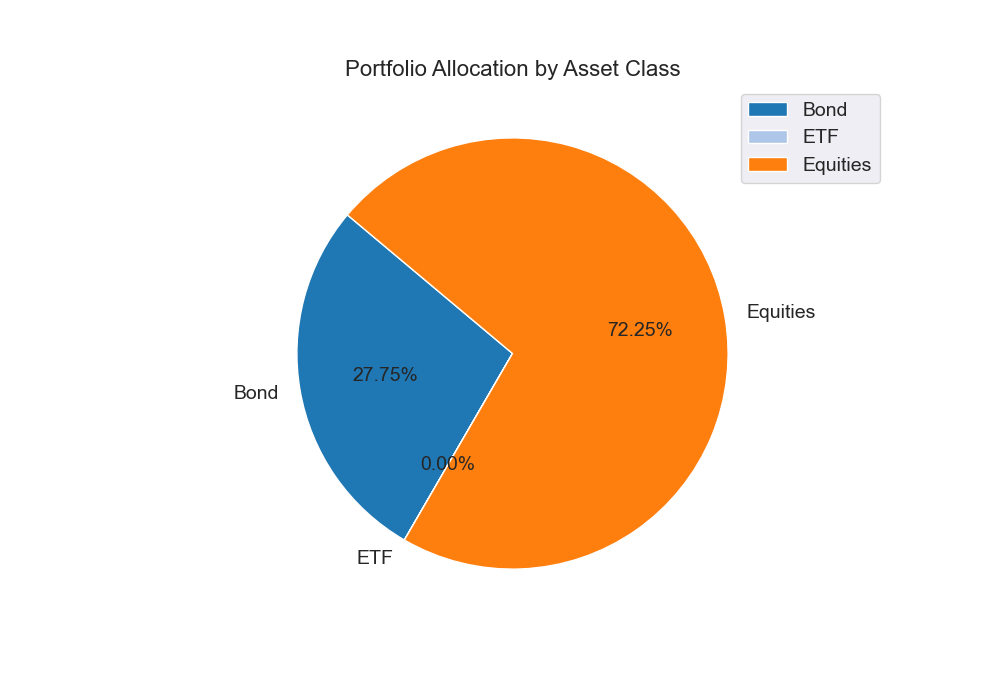

In [84]:
import matplotlib.pyplot as plt

# Plot the pie chart
plt.figure(figsize=(10, 7))
colors = plt.cm.tab20.colors
normalized_allocation.plot(kind='pie', autopct='%1.2f%%', startangle=140, colors=colors, textprops={'fontsize': 14})

# Adjust the legend to show all labels
plt.legend(labels=normalized_allocation.index, loc='upper right', bbox_to_anchor=(1.2, 1), fontsize=14)
plt.title('Portfolio Allocation by Asset Class', fontsize=16)
plt.ylabel('')  # Hide the y-label for better clarity

# Save the figure if needed
plt.savefig('portfolio_allocation_by_asset_class_normalized.png')

# Show the plot
plt.show()


In [85]:
# Identify missing tickers
missing_tickers_optimisation_data = set(optimisation_data['Ticker']) - set(optimal_weights_df.index)
missing_tickers_optimal_weights_df = set(optimal_weights_df.index) - set(optimisation_data['Ticker'])

print("Missing tickers in optimisation_data:", missing_tickers_optimisation_data)
print("Missing tickers in optimal_weights_df:", missing_tickers_optimal_weights_df)


Missing tickers in optimisation_data: {'INTU US EQUITY', 'MKS LN EQUITY', 'BNDX US EQUITY', 'IBM US EQUITY', 'NOKIA FP EQUITY', 'NKY INDEX ', 'BND US EQUITY', 'SAN FP EQUITY', 'BA US EQUITY', 'TTE FP EQUITY', 'GOOGL', 'ABI BB EQUITY', 'GS US EQUITY', 'TLSA US EQUITY', 'EZJ LN EQUITY', 'MRNA US EQUITY', 'GILD US EQUITY', 'V US EQUITY', 'DTE GY EQUITY', 'STAN LN EQUITY', 'AMZN US EQUITY', 'VRSN US EQUITY', 'JPM US EQUITY', 'ALV GR EQUITY', 'ADBE US EQUITY', 'MDLZ US EQUITY', 'LLOY LN EQUITY', 'AXP US EQUITY', 'SGRO LN EQUITY', 'REGN US EQUITY', 'BATS LN EQUITY', 'UKAB10BC INDEX', 'HL-LN EQUITY', 'ULVR LN EQUITY', 'LSEG LN EQUITY', 'AAPL US EQUITY', 'MSFT US EQUITY', 'PYPL US EQUITY', 'ITRK LN EQUITY', 'VOD LN EQUITY', 'EXPN LN EQUITY', 'CSCO US EQUITY', 'UKAB3YAC INDEX', 'AUTO LN EQUITY', 'LAND LN EQUITY', 'UTG LN EQUITY', 'SDR LN EQUITY', 'BNP FP EQUITY', 'GDBR2 INDEX', 'SBRY LN EQUITY', 'VTI US EQUITY', 'TSCO LN EQUITY'}
Missing tickers in optimal_weights_df: {0, 1, 2, 3, 4, 5, 6, 7, 8

In [86]:
print("Optimisation DataFrame Columns:", optimisation_data.columns)
print("Optimal Weights DataFrame Columns:", optimal_weights_df.columns)


Optimisation DataFrame Columns: Index(['Dates', 'Last Price', 'Volume', 'Ticker', 'Return', 'Mean Return', 'Volatility', 'Beta_HSI', 'Beta_SPX', 'Beta_SX5E', 'Beta_UKX', 'SMA_20', 'EMA_20', 'Rolling_Std_20', 'ROC_20', 'MACD', 'MACD_Signal'], dtype='object')
Optimal Weights DataFrame Columns: Index(['Ticker', 'Weight'], dtype='object')


In [87]:
# Ensure 'Ticker' is set as the index in optimal_weights_df
if 'Ticker' in optimal_weights_df.columns:
    optimal_weights_df.set_index('Ticker', inplace=True)

print("Optimal Weights DataFrame - Head (After setting index):")
print(optimal_weights_df.head())


Optimal Weights DataFrame - Head (After setting index):
                      Weight
Ticker                      
AAPL US EQUITY  1.847039e-09
ABI BB EQUITY   5.013790e-12
ADBE US EQUITY  8.826521e-10
ALV GR EQUITY   1.447452e-02
AMZN US EQUITY  1.736481e-09


In [88]:
# Strip any leading/trailing whitespace from ticker symbols
optimisation_data['Ticker'] = optimisation_data['Ticker'].str.strip()
optimal_weights_df.index = optimal_weights_df.index.str.strip()

# Identify common tickers
common_tickers = set(optimisation_data['Ticker']).intersection(optimal_weights_df.index)
print(f"Common tickers count: {len(common_tickers)}")
print(f"Total tickers in optimisation_data: {len(set(optimisation_data['Ticker']))}")
print(f"Total tickers in optimal_weights_df: {len(optimal_weights_df.index)}")

# Filter the dataframes to only include these common tickers
filtered_optimisation_data = optimisation_data[optimisation_data['Ticker'].isin(common_tickers)]
filtered_optimal_weights_df = optimal_weights_df.loc[list(common_tickers)]

print("Filtered Optimisation DataFrame - Head:")
print(filtered_optimisation_data.head())

print("Filtered Optimal Weights DataFrame - Head:")
print(filtered_optimal_weights_df.head())


Common tickers count: 52
Total tickers in optimisation_data: 52
Total tickers in optimal_weights_df: 52
Filtered Optimisation DataFrame - Head:
       Dates  Last Price       Volume          Ticker  ...  Rolling_Std_20    ROC_20      MACD  MACD_Signal
0 2021-02-01      134.14  106239823.0  AAPL US EQUITY  ...        5.410108  0.036550  2.015611     1.857849
1 2021-02-02      134.99   83305367.0  AAPL US EQUITY  ...        5.407087  0.030379  1.838010     1.853881
2 2021-02-03      133.94   89880937.0  AAPL US EQUITY  ...        5.181543  0.057978  1.594158     1.801937
3 2021-02-04      137.39   84183061.0  AAPL US EQUITY  ...        5.210951  0.049419  1.660153     1.773580
4 2021-02-05      136.76   75693830.0  AAPL US EQUITY  ...        5.230857  0.035668  1.642682     1.747400

[5 rows x 17 columns]
Filtered Optimal Weights DataFrame - Head:
                       Weight
Ticker                       
INTU US EQUITY  -2.246122e-09
MKS LN EQUITY    2.389231e-09
BNDX US EQUITY   3.000

In [89]:
# Merge the dataframes on 'Ticker'
combined_df = filtered_optimisation_data.merge(filtered_optimal_weights_df, on='Ticker', how='left')

print("Combined DataFrame - Head:")
print(combined_df.head())


Combined DataFrame - Head:
       Dates  Last Price       Volume          Ticker  ...    ROC_20      MACD  MACD_Signal        Weight
0 2021-02-01      134.14  106239823.0  AAPL US EQUITY  ...  0.036550  2.015611     1.857849  1.847039e-09
1 2021-02-02      134.99   83305367.0  AAPL US EQUITY  ...  0.030379  1.838010     1.853881  1.847039e-09
2 2021-02-03      133.94   89880937.0  AAPL US EQUITY  ...  0.057978  1.594158     1.801937  1.847039e-09
3 2021-02-04      137.39   84183061.0  AAPL US EQUITY  ...  0.049419  1.660153     1.773580  1.847039e-09
4 2021-02-05      136.76   75693830.0  AAPL US EQUITY  ...  0.035668  1.642682     1.747400  1.847039e-09

[5 rows x 18 columns]


In [90]:
# Define the asset classes dictionary
asset_classes = {
    'AAPL US EQUITY': 'Equities',
    'ABI BB EQUITY': 'Equities',
    'ADBE US EQUITY': 'Equities',
    'ALV GR EQUITY': 'Equities',
    'AMZN US EQUITY': 'Equities',
    'AUTO LN EQUITY': 'Equities',
    'AXP US EQUITY': 'Equities',
    'BA US EQUITY': 'Equities',
    'BATS LN EQUITY': 'Equities',
    'BND US EQUITY': 'Bond',
    'BNDX US EQUITY': 'Bond',
    'BNP FP EQUITY': 'Equities',
    'CSCO US EQUITY': 'Equities',
    'DTE GY EQUITY': 'Equities',
    'EXPN LN EQUITY': 'Equities',
    'EZJ LN EQUITY': 'Equities',
    'GDBR2 INDEX': 'Bond',
    'GILD US EQUITY': 'Equities',
    'GOOGL': 'Equities',
    'GS US EQUITY': 'Equities',
    'HL-LN EQUITY': 'Equities',
    'IBM US EQUITY': 'Equities',
    'INTU US EQUITY': 'Equities',
    'ITRK LN EQUITY': 'Equities',
    'JPM US EQUITY': 'Equities',
    'LAND LN EQUITY': 'Equities',
    'LLOY LN EQUITY': 'Equities',
    'LSEG LN EQUITY': 'Equities',
    'MDLZ US EQUITY': 'Equities',
    'MKS LN EQUITY': 'Equities',
    'MRNA US EQUITY': 'Equities',
    'MSFT US EQUITY': 'Equities',
    'NKY INDEX': 'Index',
    'NOKIA FP EQUITY': 'Equities',
    'PYPL US EQUITY': 'Equities',
    'REGN US EQUITY': 'Equities',
    'SAN FP EQUITY': 'Equities',
    'SBRY LN EQUITY': 'Equities',
    'SDR LN EQUITY': 'Equities',
    'SGRO LN EQUITY': 'Equities',
    'STAN LN EQUITY': 'Equities',
    'TLSA US EQUITY': 'Equities',
    'TSCO LN EQUITY': 'Equities',
    'TTE FP EQUITY': 'Equities',
    'UKAB10BC INDEX': 'Bond',
    'UKAB3YAC INDEX': 'Bond',
    'ULVR LN EQUITY': 'Equities',
    'UTG LN EQUITY': 'Equities',
    'V US EQUITY': 'Equities',
    'VOD LN EQUITY': 'Equities',
    'VRSN US EQUITY': 'Equities',
    'VTI US EQUITY': 'ETF',
    'HSI Index': 'Index',
    'UKX Index': 'Index',
    'SX5E Index': 'Index',
    'SPX Index': 'Index'
}

# Map the asset classes
combined_df['Asset Class'] = combined_df['Ticker'].map(asset_classes)

# Check for missing asset classes
missing_asset_classes = combined_df['Asset Class'].isnull().sum()
print(f"Missing asset classes: {missing_asset_classes}")

# Assign a default asset class to missing entries
default_asset_class = 'Unknown'
combined_df['Asset Class'].fillna(default_asset_class, inplace=True)

# Verify the mapping
unique_asset_classes = combined_df['Asset Class'].unique()
print(f"Unique Asset Classes after mapping: {unique_asset_classes}")

# Identify tickers mapped to 'Unknown'
unknown_tickers = combined_df[combined_df['Asset Class'] == 'Unknown']['Ticker'].unique()
print("Tickers mapped to 'Unknown':", unknown_tickers)


Missing asset classes: 0
Unique Asset Classes after mapping: ['Equities' 'Bond' 'Index' 'ETF']
Tickers mapped to 'Unknown': []


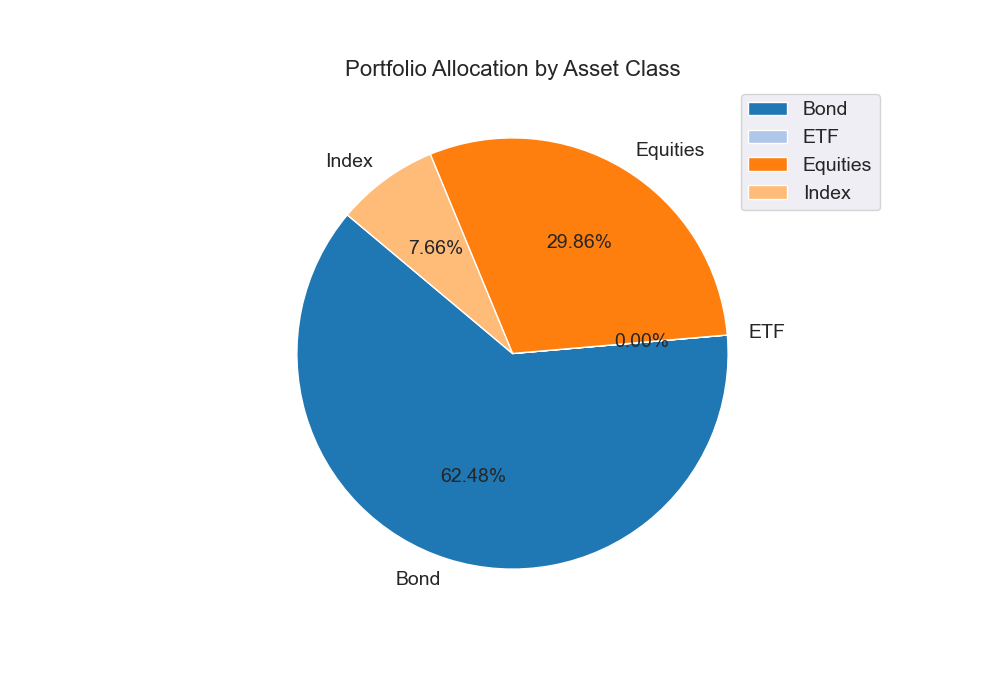

In [91]:
# Calculate the allocation by asset class
asset_class_allocation = combined_df.groupby('Asset Class')['Weight'].sum()

# Normalize weights to make small values more visible
normalized_allocation = asset_class_allocation / asset_class_allocation.sum() * 100

# Plot the pie chart
plt.figure(figsize=(10, 7))
colors = plt.cm.tab20.colors
normalized_allocation.plot(kind='pie', autopct='%1.2f%%', startangle=140, colors=colors, textprops={'fontsize': 14})

# Adjust the legend to show all labels
plt.legend(labels=normalized_allocation.index, loc='upper right', bbox_to_anchor=(1.2, 1), fontsize=14)
plt.title('Portfolio Allocation by Asset Class', fontsize=16)
plt.ylabel('')  # Hide the y-label for better clarity

# Save the figure if needed
plt.savefig('portfolio_allocation_by_asset_class_normalized.png')

# Show the plot
plt.show()


In [92]:
print("Normalized Allocation:\n", normalized_allocation)


Normalized Allocation:
 Asset Class
Bond        6.248037e+01
ETF         8.832731e-08
Equities    2.986202e+01
Index       7.657612e+00
Name: Weight, dtype: float64


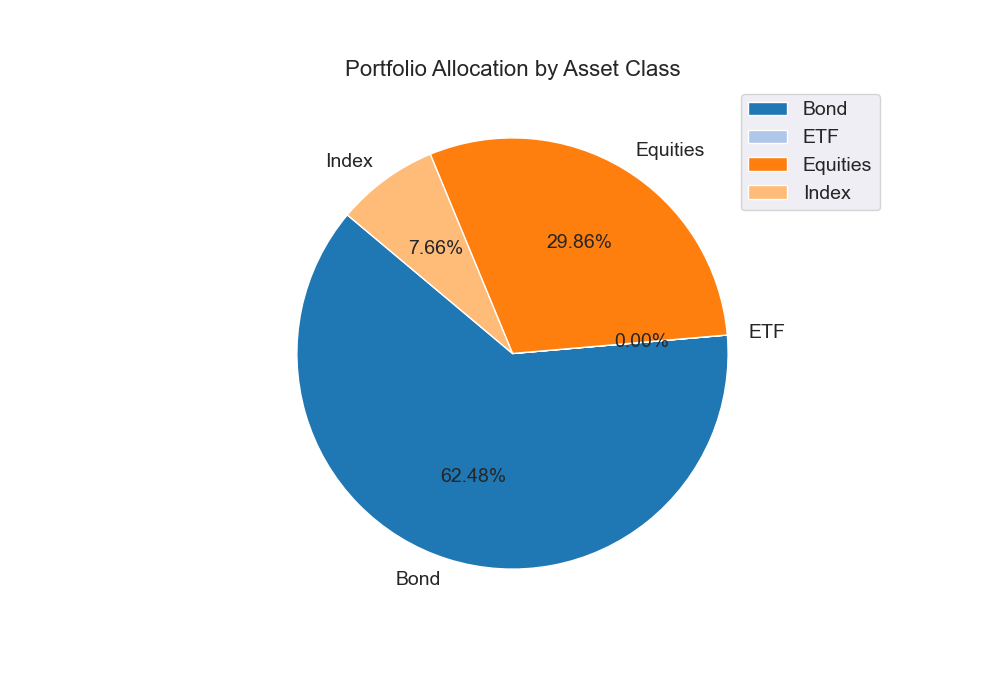

In [93]:
import matplotlib.pyplot as plt

# Plot the pie chart with updated normalized allocation
plt.figure(figsize=(10, 7))
colors = plt.cm.tab20.colors
normalized_allocation.plot(kind='pie', autopct='%1.2f%%', startangle=140, colors=colors, textprops={'fontsize': 14})

# Adjust the legend to show all labels
plt.legend(labels=normalized_allocation.index, loc='upper right', bbox_to_anchor=(1.2, 1), fontsize=14)
plt.title('Portfolio Allocation by Asset Class', fontsize=16)
plt.ylabel('')  # Hide the y-label for better clarity

# Save the figure if needed
plt.savefig('updated_portfolio_allocation_by_asset_class.png')

# Show the plot
plt.show()


# <center>**REINFORCEMENT LEARNING**</center> 

In [94]:
import gymnasium as gym
from gymnasium import spaces
import numpy as np
import pandas as pd
import logging
from stable_baselines3.common.vec_env import DummyVecEnv
from stable_baselines3 import SAC
import matplotlib.pyplot as plt

# Setup logging
logging.basicConfig(level=logging.INFO)
logging.info("Libraries imported successfully.")


INFO:root:Libraries imported successfully.


In [95]:
# Assuming combined_df is your DataFrame
try:
    price_data = combined_df.pivot_table(index='Dates', columns='Ticker', values='Last Price')
    price_data.ffill(inplace=True)
    price_data.bfill(inplace=True)
    logging.info("Remaining NaN values: %d", price_data.isna().sum().sum())
except Exception as e:
    logging.error("Error in data preprocessing: %s", e)


INFO:root:Remaining NaN values: 0


In [96]:
# Assuming combined_df is your DataFrame
try:
    price_data = combined_df.pivot_table(index='Dates', columns='Ticker', values='Last Price')
    price_data.ffill(inplace=True)
    price_data.bfill(inplace=True)
    logging.info("Remaining NaN values: %d", price_data.isna().sum().sum())
except Exception as e:
    logging.error("Error in data preprocessing: %s", e)

# Define asset classes
asset_classes = {
    'AAPL US EQUITY': 'Equities', 'ABI BB EQUITY': 'Equities', 'ADBE US EQUITY': 'Equities', 
    'ALV GR EQUITY': 'Equities', 'AMZN US EQUITY': 'Equities', 'AUTO LN EQUITY': 'Equities', 
    'AXP US EQUITY': 'Equities', 'BA US EQUITY': 'Equities', 'BATS LN EQUITY': 'Equities', 
    'BND US EQUITY': 'Bond', 'BNDX US EQUITY': 'Bond', 'BNP FP EQUITY': 'Equities', 
    'CSCO US EQUITY': 'Equities', 'DTE GY EQUITY': 'Equities', 'EXPN LN EQUITY': 'Equities', 
    'EZJ LN EQUITY': 'Equities', 'GDBR2 INDEX': 'Bond', 'GILD US EQUITY': 'Equities', 
    'GOOGL': 'Equities', 'GS US EQUITY': 'Equities', 'HL-LN EQUITY': 'Equities', 
    'IBM US EQUITY': 'Equities', 'INTU US EQUITY': 'Equities', 'ITRK LN EQUITY': 'Equities', 
    'JPM US EQUITY': 'Equities', 'LAND LN EQUITY': 'Equities', 'LLOY LN EQUITY': 'Equities', 
    'LSEG LN EQUITY': 'Equities', 'MDLZ US EQUITY': 'Equities', 'MKS LN EQUITY': 'Equities', 
    'MRNA US EQUITY': 'Equities', 'MSFT US EQUITY': 'Equities', 'NKY INDEX': 'Index', 
    'NOKIA FP EQUITY': 'Equities', 'PYPL US EQUITY': 'Equities', 'REGN US EQUITY': 'Equities', 
    'SAN FP EQUITY': 'Equities', 'SBRY LN EQUITY': 'Equities', 'SDR LN EQUITY': 'Equities', 
    'SGRO LN EQUITY': 'Equities', 'STAN LN EQUITY': 'Equities', 'TLSA US EQUITY': 'Equities', 
    'TSCO LN EQUITY': 'Equities', 'TTE FP EQUITY': 'Equities', 'UKAB10BC INDEX': 'Bond', 
    'UKAB3YAC INDEX': 'Bond', 'ULVR LN EQUITY': 'Equities', 'UTG LN EQUITY': 'Equities', 
    'V US EQUITY': 'Equities', 'VOD LN EQUITY': 'Equities', 'VRSN US EQUITY': 'Equities', 
    'VTI US EQUITY': 'ETF', 'HSI Index': 'Index', 'UKX Index': 'Index', 'SX5E Index': 'Index', 
    'SPX Index': 'Index'
}

# Add Asset Class column
combined_df['Asset Class'] = combined_df['Ticker'].map(asset_classes)

# Check for missing asset classes
missing_asset_classes = combined_df['Asset Class'].isnull().sum()
if missing_asset_classes > 0:
    logging.error("There are missing asset classes. Please update the asset_classes dictionary to include all tickers.")
else:
    logging.info("All asset classes are correctly mapped.")

print(f"Missing asset classes: {missing_asset_classes}")

# Assign a default asset class to missing entries
default_asset_class = 'Unknown'
combined_df['Asset Class'].fillna(default_asset_class, inplace=True)

# Verify the mapping
unique_asset_classes = combined_df['Asset Class'].unique()
print(f"Unique Asset Classes after mapping: {unique_asset_classes}")

# Identify tickers mapped to 'Unknown'
unknown_tickers = combined_df[combined_df['Asset Class'] == 'Unknown']['Ticker'].unique()
print("Tickers mapped to 'Unknown':", unknown_tickers)

Ticker,AAPL US EQUITY,ABI BB EQUITY,ADBE US EQUITY,ALV GR EQUITY,...,V US EQUITY,VOD LN EQUITY,VRSN US EQUITY,VTI US EQUITY
Dates,,,,,,,,,
2021-02-01,134.14,52.58,470.00,189.32,...,201.36,126.40,198.71,197.30
2021-02-02,134.99,54.56,484.93,193.28,...,201.36,127.38,202.46,200.13
2021-02-03,133.94,54.07,481.92,194.44,...,201.36,134.86,199.15,200.43
2021-02-04,137.39,54.44,489.38,195.64,...,209.25,135.82,199.31,202.97
2021-02-05,136.76,54.78,492.12,195.30,...,208.77,134.08,199.52,204.11


#### <u>**DEFINE REINFORCEMENT LEARNING ENVIRONMENT**</u> 

In [97]:
class SimplePortfolioEnv(gym.Env):
    def __init__(self, price_data):
        super(SimplePortfolioEnv, self).__init__()
        
        self.price_data = price_data
        self.n_assets = self.price_data.shape[1]
        
        # Action space: weights for each asset
        self.action_space = spaces.Box(low=0, high=1, shape=(self.n_assets,), dtype=np.float32)
        
        # Observation space: prices for each asset
        self.observation_space = spaces.Box(low=0, high=np.inf, shape=(self.n_assets,), dtype=np.float32)
        
        self.current_step = 0
        self.done = False
        self.current_prices = self.price_data.iloc[self.current_step].values
    
    def reset(self, seed=None):
        self.current_step = 0
        self.done = False
        self.current_prices = self.price_data.iloc[self.current_step].values
        return self.current_prices, {}
    
    def step(self, action):
        self.current_step += 1
        if self.current_step >= len(self.price_data):
            self.done = True
        
        reward = np.dot(self.current_prices, action)
        self.current_prices = self.price_data.iloc[self.current_step].values if not self.done else np.zeros(self.n_assets)
        
        return self.current_prices, reward, self.done, False, {}


In [98]:
def make_env():
    env = SimplePortfolioEnv(price_data)
    return env

try:
    vec_env = DummyVecEnv([make_env])
    logging.info("Environment wrapped in DummyVecEnv successfully.")
except Exception as e:
    logging.error("Failed to wrap environment in DummyVecEnv: %s", e)

INFO:root:Environment wrapped in DummyVecEnv successfully.


#### <u>**TRAIN PPO MODELS**</u> 

In [99]:
try:
    # Initialize the SAC model
    model_sac = SAC('MlpPolicy', vec_env, verbose=1)
    logging.info("SAC Model initialized successfully.")
    
    # Train the SAC model
    model_sac.learn(total_timesteps=10000)
    logging.info("SAC Model training completed.")
    
    # Save the SAC model
    model_sac.save("sac_portfolio_management")
except Exception as e:
    logging.error("SAC Model training failed: %s", e)

Using cpu device


INFO:root:SAC Model initialized successfully.


----------------------------------
| time/              |           |
|    episodes        | 4         |
|    fps             | 154       |
|    time_elapsed    | 19        |
|    total_timesteps | 3040      |
| train/             |           |
|    actor_loss      | -2.75e+05 |
|    critic_loss     | 3.2e+07   |
|    ent_coef        | 2.41      |
|    ent_coef_loss   | -745      |
|    learning_rate   | 0.0003    |
|    n_updates       | 2939      |
----------------------------------
----------------------------------
| time/              |           |
|    episodes        | 8         |
|    fps             | 153       |
|    time_elapsed    | 39        |
|    total_timesteps | 6080      |
| train/             |           |
|    actor_loss      | -4.56e+05 |
|    critic_loss     | 1.49e+07  |
|    ent_coef        | 5.99      |
|    ent_coef_loss   | -1.52e+03 |
|    learning_rate   | 0.0003    |
|    n_updates       | 5979      |
----------------------------------
--------------------

INFO:root:SAC Model training completed.


In [100]:
import gymnasium as gym
from gymnasium import spaces
import numpy as np
import pandas as pd
from stable_baselines3 import SAC
from stable_baselines3.common.vec_env import DummyVecEnv, VecNormalize
import logging

# Setup logging
logging.basicConfig(level=logging.INFO)
logging.info("Libraries imported successfully.")

class SimplePortfolioEnv(gym.Env):
    def __init__(self, price_data):
        super(SimplePortfolioEnv, self).__init__()
        
        self.price_data = price_data
        self.n_assets = self.price_data.shape[1]
        
        # Action space: weights for each asset
        self.action_space = spaces.Box(low=0, high=1, shape=(self.n_assets,), dtype=np.float32)
        
        # Observation space: prices for each asset
        self.observation_space = spaces.Box(low=0, high=np.inf, shape=(self.n_assets,), dtype=np.float32)
        
        self.current_step = 0
        self.done = False
        self.current_prices = self.price_data.iloc[self.current_step].values
    
    def reset(self):
        self.current_step = 0
        self.done = False
        self.current_prices = self.price_data.iloc[self.current_step].values
        return self.current_prices
    
    def step(self, action):
        self.current_step += 1
        if self.current_step >= len(self.price_data):
            self.done = True
        
        reward = np.dot(self.current_prices, action)
        self.current_prices = self.price_data.iloc[self.current_step].values if not self.done else np.zeros(self.n_assets)
        
        return self.current_prices, reward, self.done, {}

# Initialize the environment
try:
    env = SimplePortfolioEnv(price_data)
    logging.info("SimplePortfolioEnv initialized successfully.")
except Exception as e:
    logging.error("Environment initialization failed: %s", e)


INFO:root:Libraries imported successfully.
INFO:root:SimplePortfolioEnv initialized successfully.


In [101]:
try:
    env = SimplePortfolioEnv(price_data)
    logging.info("SimplePortfolioEnv initialized successfully.")
except Exception as e:
    logging.error("Environment initialization failed: %s", e)

INFO:root:SimplePortfolioEnv initialized successfully.


#### <u>**TESTING THE MODEL**</u> 

In [102]:
try:
    # Load the trained SAC model
    model_sac = SAC.load("sac_portfolio_management")
    logging.info("SAC Model loaded successfully for testing.")
    
    obs = env.reset()
    for _ in range(1000):
        action, _states = model_sac.predict(obs)
        obs, rewards, done, info = env.step(action)
        if done:
            obs = env.reset()
except Exception as e:
    logging.error("SAC Model testing failed: %s", e)

INFO:root:SAC Model loaded successfully for testing.


In [104]:
import matplotlib.pyplot as plt

try:
    # Load the trained SAC model
    model_sac = SAC.load("sac_portfolio_management")
    logging.info("SAC Model loaded successfully for testing.")
    
    obs = env.reset()
    rewards = []
    cumulative_reward = 0

    for _ in range(1000):
        action, _states = model_sac.predict(obs)
        obs, reward, done, _ = env.step(action)
        cumulative_reward += reward
        rewards.append(cumulative_reward)
        
        if done:
            obs = env.reset()
            cumulative_reward = 0  # Reset cumulative reward for the next episode
    logging.info("SAC Model testing completed.")
except Exception as e:
    logging.error("SAC Model testing failed: %s", e)


INFO:root:SAC Model loaded successfully for testing.
INFO:root:SAC Model testing completed.


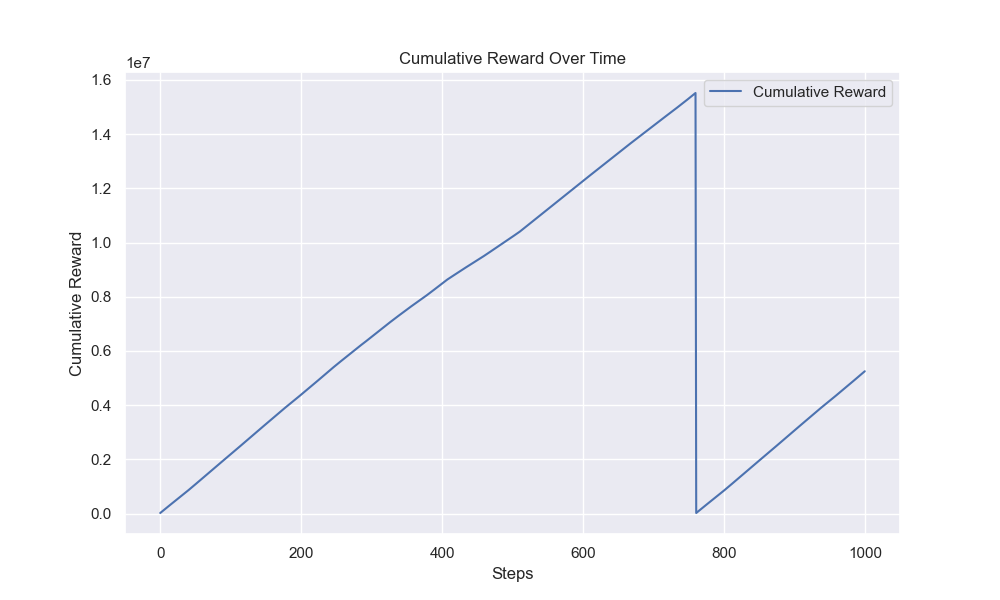

In [105]:
# Plot the cumulative rewards
plt.figure(figsize=(10, 6))
plt.plot(rewards, label='Cumulative Reward')
plt.xlabel('Steps')
plt.ylabel('Cumulative Reward')
plt.title('Cumulative Reward Over Time')
plt.legend()
plt.grid(True)
plt.show()
